# Continuous Learning for Medical Image Segmentation
L.Lafontaine, E.Gossard, N.Ranga - Creatis/Electrical Eng Dpt of INSA Lyon - Fall 2024




# Libraries

### Package installation and imports

In [1]:
# Package installations
%pip install dicom2nifti    # For DICOM to NIfTI conversion
%pip install nibabel        # For medical image processing
%pip install torchinfo      # For neural network model visualization
%pip install nilearn        # For neuroimaging data analysis
%pip install torch          # Deep learning framework
%pip install torchvision    # Computer vision utilities for PyTorch
%pip install torchaudio     # Audio processing tools for PyTorch
%pip install monai          # Medical imaging deep learning framework
%pip install albumentations # For data augmentation
%pip install torchmetrics
%pip install torchmetrics

# Deep Learning Framework
import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import Dataset, DataLoader, Subset
import torchmetrics

# Computer Vision and Image Processing
import torchvision
from torchvision import datasets, transforms
import cv2
import dicom2nifti

# Medical Image Processing
import nibabel as nib
import nilearn as nil
from monai.transforms import LoadImage
from monai.losses import DiceLoss

# Data Processing and Analysis
import numpy as np
import scipy.ndimage as ndi
from scipy.ndimage import zoom
from sklearn.model_selection import train_test_split
import albumentations

# Model Analysis and Visualization
import torchinfo
from torchinfo import summary
from tqdm.auto import tqdm

# File and Path Management
import os
from pathlib import Path
from typing import Optional, Union, Tuple
import shutil

# Visualization
import matplotlib
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
%matplotlib inline
import random


import os
import numpy as np
from sklearn.model_selection import train_test_split
from torch.utils.data import Dataset, DataLoader
import torch
import albumentations as A
from albumentations.pytorch import ToTensorV2
import cv2

import matplotlib.pyplot as plt
import numpy as np
import torch
from torch import Tensor
from typing import Optional, Union
from matplotlib.colors import ListedColormap
from mpl_toolkits.axes_grid1 import make_axes_locatable

import pandas as pd
# Clear CUDA cache
torch.cuda.empty_cache()


Defaulting to user installation because normal site-packages is not writeable
Note: you may need to restart the kernel to use updated packages.
Defaulting to user installation because normal site-packages is not writeable
Note: you may need to restart the kernel to use updated packages.
Defaulting to user installation because normal site-packages is not writeable
Note: you may need to restart the kernel to use updated packages.
Defaulting to user installation because normal site-packages is not writeable
Note: you may need to restart the kernel to use updated packages.
Defaulting to user installation because normal site-packages is not writeable
Note: you may need to restart the kernel to use updated packages.
Defaulting to user installation because normal site-packages is not writeable
Note: you may need to restart the kernel to use updated packages.
Defaulting to user installation because normal site-packages is not writeable
Note: you may need to restart the kernel to use updated pa

/projects/INSA-Image/Lib/conda/anaconda3/envs/monai-dev/lib/python3.10/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm
A new version of Albumentations is available: '2.0.1' (you have '2.0.0'). Upgrade using: pip install -U albumentations. To disable automatic update checks, set the environment variable NO_ALBUMENTATIONS_UPDATE to 1.


### Version Verification

In [2]:
# Version Verification to ensure compatibility and reproducibility.

print(f"PyTorch version: {torch.__version__}")
print(f"Torchvision version: {torchvision.__version__}")
print(f"Numpy version: {np.__version__}")
print(f"Matplotlib version: {matplotlib.__version__}")


PyTorch version: 2.5.1
Torchvision version: 0.20.1
Numpy version: 1.26.4
Matplotlib version: 3.9.4


# Data Preparation

### Definition of custom colormap

In [3]:
def create_custom_colormap():
    """
    Create a custom colormap for classes 0 to 20.
    Class 0 is black (background).
    """
    # Define colors for 21 classes (0 to 20)
    colors = [(0, 0, 0)]  # Class 0 is black (background)
    
    # Add colors for classes 1 to 20 using 'jet' colormap
    for i in range(1, 21):
        color = plt.cm.jet(i / 20)  # Use 'jet' colormap for classes 1 to 20
        colors.append(color[:3])  # Take only RGB components (ignore alpha)
    
    # Create the colormap
    cmap = mcolors.ListedColormap(colors)
    return cmap

# Display class-color mapping:
# Class 0: Black (Background)
# Class 1: Blue, Class 2: Light Blue, Class 3: Cyan, Class 4: Teal
# Class 5: Light Green, Class 6: Green, Class 7: Yellow-Green, Class 8: Yellow
# Class 9: Orange-Yellow, Class 10: Orange, Class 11: Red-Orange, Class 12: Red
# Class 13: Light Red, Class 14: Magenta-Red, Class 15: Magenta
# Class 16: Violet, Class 17: Dark Violet, Class 18: Dark Blue
# Class 19: Very Dark Blue, Class 20: Very Dark Red (almost black)

custom_cmap = create_custom_colormap()


### Data pre-processing functions

In [4]:

# Load NIfTI files and return data and spacing
def load_nifti(file_path):
    nii = nib.load(file_path)
    data = nii.get_fdata()
    spacing = nii.header.get_zooms()
    return data, spacing

# Align shapes by cropping or padding
def align_shapes(image, label):
    img_shape = image.shape
    lbl_shape = label.shape
    # Crop if label is larger
    label = label[:img_shape[0], :img_shape[1], :img_shape[2]]
    # Pad if label is smaller
    padding = [(0, max(0, img_dim - lbl_dim)) for img_dim, lbl_dim in zip(img_shape, lbl_shape)]
    label = np.pad(label, padding, mode='constant', constant_values=0)
    return label

# Resample data to match spacing
def resample_to_spacing(data, source_spacing, target_spacing):
    rescale_factors = [src / tgt for src, tgt in zip(source_spacing, target_spacing)]
    return zoom(data, rescale_factors, order=1)

# Superpose and visualize
def show_superposed_slices(image, label, slice_idx, alpha=0.4):
    """
    Visualize superimposed image and label slices.
    - image: 3D image data
    - label: 3D label data
    - slice_idx: Index of the slice along the z-axis
    - alpha: Transparency level for label overlay
    """
    image_slice = image[:, :, slice_idx]
    label_slice = label[:, :, slice_idx]

    plt.figure(figsize=(8, 8))
    plt.imshow(image_slice, cmap="gray", interpolation="nearest")
    plt.imshow(label_slice, cmap=custom_cmap, alpha=alpha, interpolation="nearest")
    plt.title(f"Superposed Slice {slice_idx}")
    plt.axis("off")
    plt.show()

# Align image and label
def align_image_and_label(image_path, label_path):
    # Load files
    image_data, image_spacing = load_nifti(image_path)
    label_data, label_spacing = load_nifti(label_path)

    # Resample label to match image spacing
    label_resampled = resample_to_spacing(label_data, label_spacing, image_spacing)

    # Align shapes
    label_aligned = align_shapes(image_data, label_resampled)

    return image_data, label_aligned


### Visualize superposition of unlabelled and labelled data by accessing .nii.gz files

In [5]:

def get_random_image_and_label(data_dir):
    # Get all NIfTI files (both image and label)
    all_files = sorted([f for f in os.listdir(data_dir) if f.endswith(".nii.gz")])

    # Randomly pick an image-label pair
    random_idx = random.randint(0, len(all_files) - 1)
    image_file = all_files[random_idx]
    
    # Ensure the corresponding label file exists
    if "_label" in image_file:
        label_file = image_file
        image_file = image_file.replace("_label", "")  # Assuming image file name is derived from label file
    else:
        label_file = image_file.replace(".nii.gz", "_label.nii.gz")
    
    image_path = os.path.join(data_dir, image_file)
    label_path = os.path.join(data_dir, label_file)
    
    return image_path, label_path

def get_random_slice_index(image_file_path):
    # Load the image to get the number of slices
    nii = nib.load(image_file_path)
    image_data = nii.get_fdata()

    # Randomly select a valid slice index
    slice_idx = random.randint(0, image_data.shape[2] - 1)
    
    return slice_idx

# Replace with your data directory
data_dir = "data"

# Get random image and label file paths
image_file_path, label_file_path = get_random_image_and_label(data_dir)

# Get a random slice index for the selected image
slice_index = get_random_slice_index(image_file_path)

print("Random Image File Path:", image_file_path)
print("Random Label File Path:", label_file_path)
print("Random Slice Index:", slice_index)


# # Visualize superposed slices
# # Align data
# image_data, aligned_label = align_image_and_label(image_file_path, label_file_path)
# show_superposed_slices(image_data, aligned_label, slice_idx=slice_index)

Random Image File Path: data/GENESIS_3T_ML03J_S1.nii.gz
Random Label File Path: data/GENESIS_3T_ML03J_S1_label.nii.gz
Random Slice Index: 60


### Database Conversion from .nii.gz files to .npy slice matrix files 

In [6]:

def find_and_resize(image, label, target_size): # NOTE RESIZE 250/3 ≈ 84, 350/3 ≈ 117
    """
    Resizes image and label while maintaining aspect ratio and adding padding if needed.
    Returns resized image and label with the same target size.
    """
    # Get current dimensions
    h, w = image.shape
    target_h, target_w = target_size
    
    # Calculate scaling factor to maintain aspect ratio
    scale = min(target_h/h, target_w/w)
    
    # Calculate new dimensions
    new_h = int(h * scale)
    new_w = int(w * scale)
    
    # Resize image and label
    resized_image = cv2.resize(image, (new_w, new_h), interpolation=cv2.INTER_LINEAR)
    resized_label = cv2.resize(label, (new_w, new_h), interpolation=cv2.INTER_NEAREST)
    
    # Create blank (zero) images of target size
    final_image = np.zeros((target_h, target_w))
    final_label = np.zeros((target_h, target_w))
    
    # Calculate padding
    pad_h = (target_h - new_h) // 2
    pad_w = (target_w - new_w) // 2
    
    # Place resized images in center
    final_image[pad_h:pad_h+new_h, pad_w:pad_w+new_w] = resized_image
    final_label[pad_h:pad_h+new_h, pad_w:pad_w+new_w] = resized_label
    
    return final_image, final_label

def prepare_database(data_dir, output_dir, target_size):#=(250, 350)
    """Prepare database by processing and saving aligned image/label pairs slice by slice"""
    
    # Create output directories for slices
    os.makedirs(os.path.join(output_dir, 'image_slices'), exist_ok=True)
    os.makedirs(os.path.join(output_dir, 'label_slices'), exist_ok=True)

    # Process each file in data directory
    for filename in os.listdir(data_dir):
        if filename.endswith(".nii.gz"):
            if "_label" in filename:
                # This is a label file
                label_path = os.path.join(data_dir, filename)
                image_path = label_path.replace("_label", "")

                if os.path.exists(image_path):
                    print(f"Processing {filename}...")
                    
                    # Load and align image/label pair
                    image_data, image_spacing = load_nifti(image_path)
                    label_data, label_spacing = load_nifti(label_path)

                    # Resample label to match image spacing
                    label_resampled = resample_to_spacing(label_data, 
                                                        label_spacing, 
                                                        image_spacing)

                    # Align shapes
                    label_aligned = align_shapes(image_data, label_resampled)

                    # Process each slice
                    for slice_idx in range(image_data.shape[2]):
                        # Extract slices
                        image_slice = image_data[:, :, slice_idx]
                        label_slice = label_aligned[:, :, slice_idx]

                        # Normalize image slice to [0, 1] range
                        image_slice = (image_slice - image_slice.min()) / (image_slice.max() - image_slice.min())
                        
                        # Resize slices while maintaining aspect ratio
                        resized_image, resized_label = find_and_resize(image_slice, label_slice, target_size)

                        # Save processed slices
                        base_name = os.path.splitext(os.path.splitext(filename)[0])[0]
                        np.save(os.path.join(output_dir, 'image_slices', 
                                           f"{base_name.replace('_label','')}_slice_{slice_idx:03d}.npy"), 
                               resized_image)
                        np.save(os.path.join(output_dir, 'label_slices', 
                                           f"{base_name}_slice_{slice_idx:03d}.npy"), 
                               resized_label)

    print("Database preparation complete")

# Print image sizes before creating the dataset
def check_image_sizes(image_dir):
    sizes = []
    for img_file in os.listdir(image_dir):
        if img_file.endswith('.npy'):
            img = np.load(os.path.join(image_dir, img_file))
            sizes.append(img.shape)
    return np.unique(sizes, axis=0)



In [7]:

# Use local paths
data_dir = "data"
  
# Clean contents of processed_data folder if it exists
output_dir = "processed_data"
if os.path.exists(output_dir):
    print("Cleaning previous processed data...")
    # Remove contents of image_slices
    image_slices_dir = os.path.join(output_dir, 'image_slices')
    if os.path.exists(image_slices_dir):
        shutil.rmtree(image_slices_dir)
    
    # Remove contents of label_slices
    label_slices_dir = os.path.join(output_dir, 'label_slices')
    if os.path.exists(label_slices_dir):
        shutil.rmtree(label_slices_dir)
    
    print("Previous processed data removed.")
target_size =  (250, 350)  #(84,117) Adjust based on your typical image dimensions

# Run the processing
print("Starting database preparation...")
prepare_database(data_dir, output_dir, target_size)

# Check results
print("\nChecking final image sizes...")
unique_sizes = check_image_sizes(os.path.join(output_dir, 'image_slices'))
print(f"Found image sizes: {unique_sizes}")


Cleaning previous processed data...
Previous processed data removed.
Starting database preparation...
Processing GENESIS_3T_ML03_S1_label.nii.gz...
Processing GENESIS_3T_BD07_S1_label.nii.gz...
Processing FATCOVID_3T_DUH24_S1_label.nii.gz...
Processing GENESIS_3T_ML03J_S1_label.nii.gz...
Processing MUST_15T_ALB2725_S1_label.nii.gz...
Database preparation complete

Checking final image sizes...
Found image sizes: [[250 350]]


### Compare raw data slices from nii.gz file and the processed data slices from .npy files :

Selected file: GENESIS_3T_ML03J_S1.nii.gz
Selected slice index: 76


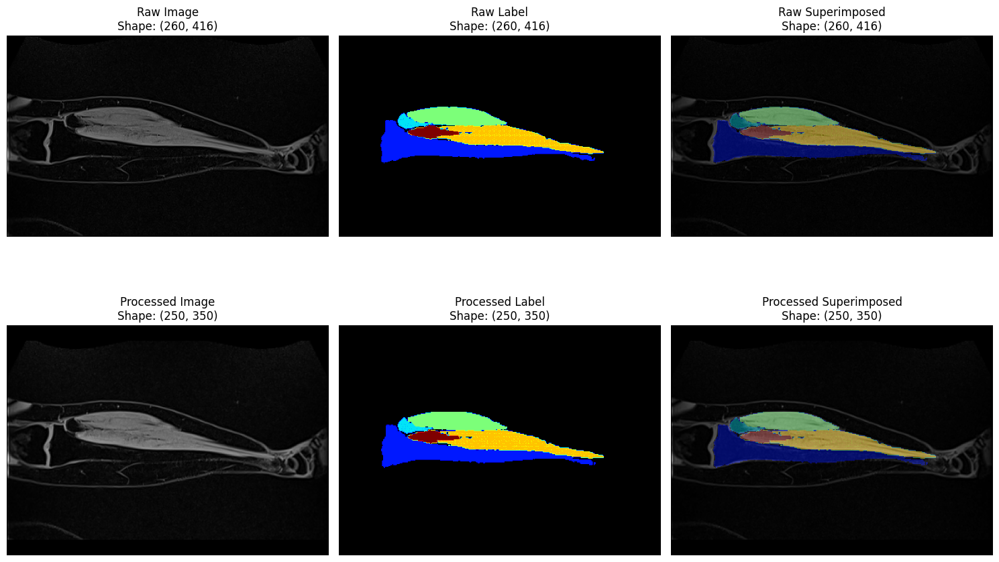


Image shapes:
Raw image shape: (260, 416)
Processed image shape: (250, 350)

Unique label values:
Raw label values: [0. 1. 2. 3. 4. 6.]
Processed label values: [0. 1. 2. 3. 4. 6.]


In [8]:

def load_and_compare_slices():
    # 1. Get random .nii.gz file from raw data
    raw_files = [f for f in os.listdir("data") if f.endswith(".nii.gz") and "_label" not in f]
    random_file = random.choice(raw_files)
    print(f"Selected file: {random_file}")
    
    # 2. Load raw data
    raw_nii = nib.load(os.path.join("data", random_file))
    raw_data = raw_nii.get_fdata()
    
    # Load corresponding label
    raw_label_nii = nib.load(os.path.join("data", random_file.replace(".nii.gz", "_label.nii.gz")))
    raw_label = raw_label_nii.get_fdata()
    
    # 3. Pick a random slice index
    slice_idx = random.randint(0, raw_data.shape[2]-1)
    print(f"Selected slice index: {slice_idx}")
    
    # 4. Get raw slices
    raw_image_slice = raw_data[:, :, slice_idx]
    raw_label_slice = raw_label[:, :, slice_idx]
    
    # Normalize raw image for visualization
    raw_image_slice = (raw_image_slice - raw_image_slice.min()) / (raw_image_slice.max() - raw_image_slice.min())
    
    # 5. Load corresponding processed slices
    base_name = os.path.splitext(os.path.splitext(random_file)[0])[0]
    processed_image = np.load(os.path.join("processed_data", "image_slices", 
                                         f"{base_name}_slice_{slice_idx:03d}.npy"))
    processed_label = np.load(os.path.join("processed_data", "label_slices", 
                                         f"{base_name}_label_slice_{slice_idx:03d}.npy"))
    
    # 6. Create visualization
    plt.figure(figsize=(15, 10))
    
    # Raw data
    plt.subplot(231)
    plt.imshow(raw_image_slice, cmap='gray')
    plt.title(f'Raw Image\nShape: {raw_image_slice.shape}')
    plt.axis('off')
    
    plt.subplot(232)
    plt.imshow(raw_label_slice, cmap=custom_cmap)
    plt.title(f'Raw Label\nShape: {raw_label_slice.shape}')
    plt.axis('off')
    
    plt.subplot(233)
    plt.imshow(raw_image_slice, cmap='gray')
    plt.imshow(raw_label_slice, cmap=custom_cmap, alpha=0.4)
    plt.title(f'Raw Superimposed\nShape: {raw_image_slice.shape}')
    plt.axis('off')
    
    # Processed data
    plt.subplot(234)
    plt.imshow(processed_image, cmap='gray')
    plt.title(f'Processed Image\nShape: {processed_image.shape}')
    plt.axis('off')
    
    plt.subplot(235)
    plt.imshow(processed_label, cmap=custom_cmap)
    plt.title(f'Processed Label\nShape: {processed_label.shape}')
    plt.axis('off')
    
    plt.subplot(236)
    plt.imshow(processed_image, cmap='gray')
    plt.imshow(processed_label, cmap=custom_cmap, alpha=0.4)
    plt.title(f'Processed Superimposed\nShape: {processed_image.shape}')
    plt.axis('off')
    
    plt.tight_layout()
    plt.show()
    
    # Print shapes for comparison
    print("\nImage shapes:")
    print(f"Raw image shape: {raw_image_slice.shape}")
    print(f"Processed image shape: {processed_image.shape}")
    
    # Print unique values in labels to verify segmentation preservation
    print("\nUnique label values:")
    print(f"Raw label values: {np.unique(raw_label_slice)}")
    print(f"Processed label values: {np.unique(processed_label)}")

# Run the comparison
load_and_compare_slices()


### Class distribution summary by patient

In [9]:
import re
from collections import defaultdict
def analyze_label_files(label_dir):
    """
    Detailed analysis of label files ending with _label_slice_XXX.npy
    Counts the number of classes for each patient and prints a summary in a table format.
    """
    print("Starting label file analysis...")
    
    # Check if the directory exists
    if not os.path.exists(label_dir):
        print(f"Error: The directory {label_dir} does not exist.")
        return
    
    # List all files in the directory
    all_files = os.listdir(label_dir)
    
    # Specifically look for files ending with _label_slice_XXX.npy
    files = [f for f in all_files if re.match(r'.*_label_slice_\d{3}\.npy$', f)]
    
    if not files:
        print(f"Error: No *_label_slice_XXX.npy files found in {label_dir}")
        return
    
    patient_labels = defaultdict(list)
    
    for f in files:
        # Extract patient name from the filename
        patient_name = f.split('_label_slice')[0]
        patient_labels[patient_name].append(f)
    
    all_class_counts = defaultdict(dict)
    
    for patient_name, label_files in patient_labels.items():
        # Initialize the dictionary for storing class counts for the current patient
        patient_class_counts = defaultdict(int)
        
        for filename in label_files:
            file_path = os.path.join(label_dir, filename)
            
            try:
                # Load the file
                label_data = np.load(file_path)
                
                # Get unique values and their counts
                unique, counts = np.unique(label_data, return_counts=True)
                
                # Update the class counts for the current patient
                for val, count in zip(unique, counts):
                    patient_class_counts[val] += count
                
            except Exception as e:
                print(f"    Error processing {filename}: {str(e)}")
        
        # Store the patient class counts
        all_class_counts[patient_name] = patient_class_counts
    
    # Create a DataFrame to organize the results
    all_labels = sorted(set(label for patient in all_class_counts.values() for label in patient.keys()))
    summary_df = pd.DataFrame(columns=['Class Label'] + list(all_class_counts.keys()))
    summary_df['Class Label'] = all_labels
    
    for patient_name, patient_class_counts in all_class_counts.items():
        summary_df[patient_name] = summary_df['Class Label'].apply(
            lambda x: patient_class_counts.get(x, 0)
        )
    
    # Print the summary table
    print("\nClass distribution summary by patient:")
    print(summary_df.to_string(index=False))
    
# Usage
label_dir = "processed_data/label_slices"  # Replace with your actual path
analyze_label_files(label_dir)


Starting label file analysis...

Class distribution summary by patient:
 Class Label  GENESIS_3T_ML03_S1  GENESIS_3T_BD07_S1  FATCOVID_3T_DUH24_S1  GENESIS_3T_ML03J_S1  MUST_15T_ALB2725_S1
         0.0            12512768            12528029              13340524             13394433             12838583
         1.0              183802              202698                274377               100808               137866
         2.0              163431              154146                172727                23300               108896
         3.0              163460              151362                191417                35837               143673
         4.0              213441              229101                307029                82167                84146
         5.0               94053               82726                114690               171619               393783
         6.0              324094              298545                506026                75798              

# U-Net : let the magic begin

### Data Augmentation and create the train, valid, test datasets

In [10]:
# Define a custom dataset class
class CustomDataset(Dataset):
    def __init__(self, image_files, label_files, transform=None):
        self.image_files = image_files
        self.label_files = label_files
        self.transform = transform

    def __len__(self):
        return len(self.image_files)

    def __getitem__(self, idx):
        # Load image and label from .npy files
        image = np.load(self.image_files[idx]).astype(np.float32)
        label = np.load(self.label_files[idx]).astype(np.float32)
        
        # Add channel dimension if missing
        if image.ndim == 2:
            image = np.expand_dims(image, axis=-1)  # Shape: (H, W, 1)
        if label.ndim == 2:
            label = np.expand_dims(label, axis=-1)  # Shape: (H, W, 1)

        # Apply transformations if provided
        if self.transform:
            transformed = self.transform(image=image, mask=label)
            image = transformed['image']
            label = transformed['mask']

        # Remove the channel dimension from the label
        label = label.squeeze(-1)  # Shape: (H, W)

        return image, label


In [11]:

# Define transformations for training
train_transforms = A.Compose([
    # Conservative spatial transforms
    A.Rotate(
        limit=4,
        p=0.5,
        border_mode=cv2.BORDER_CONSTANT
    ),
    A.Affine(
        scale=(1, 1.05),
        translate_percent=(-0.05, 0.05),
        shear=(-5, 5),
        p=0.5
    ),
    A.ElasticTransform(alpha=1, sigma=50, alpha_affine=50, p=0.5),
    # Mild intensity adjustments
    A.RandomBrightnessContrast(
        brightness_limit=0.1,
        contrast_limit=0.1,
        p=0.3
    ),
    A.RandomGamma(
        gamma_limit=(90, 110),
        p=0.2
    ),
    # Preserve anatomical validity
    A.OneOf([
        A.GaussNoise(var_limit=10, p=0.5),
        A.GaussianBlur(blur_limit=3, p=0.5),
    ], p=0.2),
    A.Normalize(mean=(0.0,), std=(1.0,)),
    ToTensorV2()
])

# No augmentation for validation and testing, just normalization and conversion to tensor
base_transforms = A.Compose([
    A.Normalize(mean=(0.0,), std=(1.0,)),
    ToTensorV2()
])

Argument 'alpha_affine' is not valid and will be ignored.
Argument 'var_limit' is not valid and will be ignored.
blur_limit and sigma_limit minimum value can not be both equal to 0. blur_limit minimum value changed to 3.


In [12]:


# Define directories
image_dir = 'processed_data/image_slices'
label_dir = 'processed_data/label_slices'

# Create a list of image and label file paths
image_files = []
label_files = []

for filename in os.listdir(image_dir):
    if filename.endswith('.npy'):
        image_path = os.path.join(image_dir, filename)
        label_path = os.path.join(label_dir, filename.replace('image_slices', 'label_slices').replace('slice_', 'label_slice_'))

        # Check if the corresponding label file exists
        if os.path.exists(label_path):
            image_files.append(image_path)
            label_files.append(label_path)

# Split the data into training, validation, and testing sets
train_image_files, temp_image_files, train_label_files, temp_label_files = train_test_split(
    image_files, label_files, test_size=0.3, random_state=42
)

valid_image_files, test_image_files, valid_label_files, test_label_files = train_test_split(
    temp_image_files, temp_label_files, test_size=0.5, random_state=42
)



In [13]:

# Create Dataset objects
train_dataset = CustomDataset(train_image_files, train_label_files, transform=train_transforms)
valid_dataset = CustomDataset(valid_image_files, valid_label_files, transform=base_transforms)
test_dataset = CustomDataset(test_image_files, test_label_files, transform=base_transforms)

# Prepare DataLoaders
batch_size = 8
train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True, pin_memory=True)
valid_loader = DataLoader(valid_dataset, batch_size=batch_size, shuffle=False, pin_memory=True)
test_loader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False, pin_memory=True)

# Print dataset sizes and test data loading
print(f"Training dataset size: {len(train_dataset)}")
print(f"Validation dataset size: {len(valid_dataset)}")
print(f"Testing dataset size: {len(test_dataset)}")

# Test the DataLoader
for images, labels in train_loader:
    print(f"Batch of images shape: {images.shape}, dtype: {images.dtype}")
    print(f"Batch of labels shape: {labels.shape}, dtype: {labels.dtype}")
    break

# Test a single sample from the dataset
sample_image, sample_label = train_dataset[0]
print(f"Sample image shape: {sample_image.shape}, dtype: {sample_image.dtype}")
print(f"Sample label shape: {sample_label.shape}, dtype: {sample_label.dtype}")

# Create export directory if it doesn't exist
export_dir = 'exported_data'
os.makedirs(export_dir, exist_ok=True)

# Export the datasets
np.save(os.path.join(export_dir, 'train_image_files.npy'), train_image_files)
np.save(os.path.join(export_dir, 'train_label_files.npy'), train_label_files)
np.save(os.path.join(export_dir, 'valid_image_files.npy'), valid_image_files)
np.save(os.path.join(export_dir, 'valid_label_files.npy'), valid_label_files)
np.save(os.path.join(export_dir, 'test_image_files.npy'), test_image_files)
np.save(os.path.join(export_dir, 'test_label_files.npy'), test_label_files)

# To reimport the datasets, you can use the following code:
# train_image_files = np.load(os.path.join(export_dir, 'train_image_files.npy'), allow_pickle=True)
# train_label_files = np.load(os.path.join(export_dir, 'train_label_files.npy'), allow_pickle=True)
# valid_image_files = np.load(os.path.join(export_dir, 'valid_image_files.npy'), allow_pickle=True)
# valid_label_files = np.load(os.path.join(export_dir, 'valid_label_files.npy'), allow_pickle=True)
# test_image_files = np.load(os.path.join(export_dir, 'test_image_files.npy'), allow_pickle=True)
# test_label_files = np.load(os.path.join(export_dir, 'test_label_files.npy'), allow_pickle=True)


Training dataset size: 571
Validation dataset size: 122
Testing dataset size: 123
Batch of images shape: torch.Size([8, 1, 250, 350]), dtype: torch.float32
Batch of labels shape: torch.Size([8, 250, 350]), dtype: torch.float32
Sample image shape: torch.Size([1, 250, 350]), dtype: torch.float32
Sample label shape: torch.Size([250, 350]), dtype: torch.float32


In [14]:
export_dir = 'exported_data'

# Load the datasets
train_image_files = np.load(os.path.join(export_dir, 'train_image_files.npy'), allow_pickle=True)
train_label_files = np.load(os.path.join(export_dir, 'train_label_files.npy'), allow_pickle=True)
valid_image_files = np.load(os.path.join(export_dir, 'valid_image_files.npy'), allow_pickle=True)
valid_label_files = np.load(os.path.join(export_dir, 'valid_label_files.npy'), allow_pickle=True)
test_image_files = np.load(os.path.join(export_dir, 'test_image_files.npy'), allow_pickle=True)
test_label_files = np.load(os.path.join(export_dir, 'test_label_files.npy'), allow_pickle=True)

# Recreate Dataset objects
train_dataset = CustomDataset(train_image_files, train_label_files, transform=train_transforms)
valid_dataset = CustomDataset(valid_image_files, valid_label_files, transform=base_transforms)
test_dataset = CustomDataset(test_image_files, test_label_files, transform=base_transforms)

# Prepare DataLoader objects again
batch_size = 8
train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True, pin_memory=True)
valid_loader = DataLoader(valid_dataset, batch_size=batch_size, shuffle=False, pin_memory=True)
test_loader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False, pin_memory=True)


### Visualize augmented batch training data :

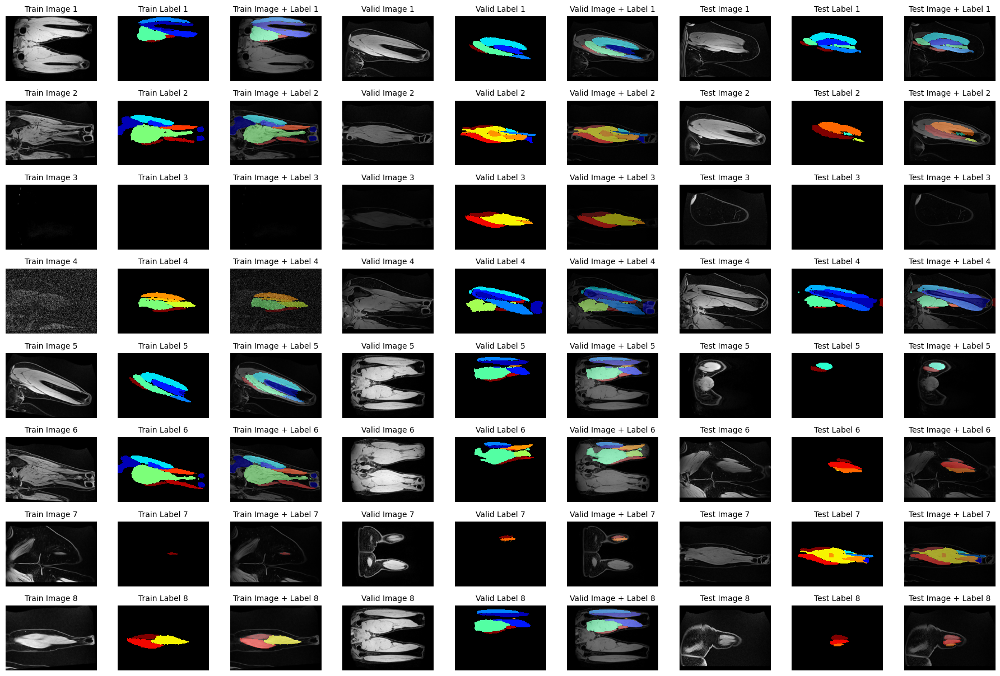

In [15]:
# Define imagesc function (similar to MATLAB's imagesc)
def imagesc(
    ax: plt.Axes,
    image: Union[Tensor, np.ndarray],
    title: Optional[str] = None,
    colormap: plt.cm = plt.cm.gray,
    clim: Optional[tuple[float, float]] = None,
    show_axis: bool = False,
    show_colorbar: bool = True,
    **kwargs,
) -> None:
    """Display image with scaled colors. Similar to Matlab's imagesc."""
    # Handle color limits (clim)
    if clim is not None and isinstance(clim, (list, tuple)):
        if len(clim) == 2 and (clim[0] < clim[1]):
            clim_args = {"vmin": float(clim[0]), "vmax": float(clim[1])}
        else:
            raise ValueError("clim must be a tuple of (min, max) with min < max.")
    else:
        clim_args = {}

    # Convert Tensor to numpy if needed
    if isinstance(image, Tensor):
        image = image.cpu().detach().numpy()

    im = ax.imshow(image, colormap, **clim_args, **kwargs)
    ax.set_title(title, fontsize=10)

    if show_colorbar:
        divider = make_axes_locatable(ax)
        cax = divider.append_axes("right", size="5%", pad=0.05)
        plt.colorbar(im, cax=cax)

    if not show_axis:
        ax.set_axis_off()

# Function to plot images and labels
def plot_images_and_labels(images, labels, start_index, title_prefix):
    for i in range(len(images)):
        image = images[i].squeeze()  # Remove singleton dimensions
        label = labels[i].squeeze()  # Ensure 2D label
        ax = figure.add_subplot(len(images), 9, i * 9 + start_index)
        imagesc(ax, image, title=f"{title_prefix} Image {i+1}", show_colorbar=False)
        ax = figure.add_subplot(len(images), 9, i * 9 + start_index + 1)
        imagesc(ax, label, title=f"{title_prefix} Label {i+1}", show_colorbar=False, colormap=custom_cmap, interpolation="nearest")
        ax = figure.add_subplot(len(images), 9, i * 9 + start_index + 2)
        imagesc(ax, image, title=f"{title_prefix} Image + Label {i+1}", show_colorbar=False)
        ax.imshow(label, cmap=custom_cmap, alpha=0.5, interpolation="nearest")

# Get a random batch of data from each loader
train_images, train_labels = next(iter(train_loader))
valid_images, valid_labels = next(iter(valid_loader))
test_images, test_labels = next(iter(test_loader))

# Create the figure
figure = plt.figure(figsize=(18, 12), dpi=100)

# Plot training, validation, and test data
plot_images_and_labels(train_images, train_labels, 1, "Train")
plot_images_and_labels(valid_images, valid_labels, 4, "Valid")
plot_images_and_labels(test_images, test_labels, 7, "Test")

# Adjust layout and display
figure.tight_layout(pad=0.5)
figure.subplots_adjust(wspace=0.1, hspace=0.3)
plt.show()


### Architecture of U Net

In [16]:
# Model setup
num_classes = 21
input_shape = (1, 350, 250)
output_shape = (num_classes, 350, 250)
init_channels = 64

In [17]:
class UNet(nn.Module):
    """Architecture based on U-Net: Convolutional Networks for Biomedical Image Segmentation.

    References:
    - Paper that introduced the U-Net model: https://arxiv.org/abs/1505.04597
    """

    def __init__(
        self,
        input_shape: Tuple[int, ...],
        output_shape: Tuple[int, ...],
        init_channels: int = 64,  # Increased initial channels
        use_batchnorm: bool = True,
        bilinear: bool = False,
        dropout: float = 0.0,
    ):
        """Initializes class instance.

        Args:
            input_shape: (in_channels, H, W), Shape of the input images.
            output_shape: (num_classes, H, W), Shape of the output segmentation map.
            init_channels: Number of output feature maps from the first layer, used to compute the number of feature
                maps in following layers.
            use_batchnorm: Whether to use batch normalization between the convolution and activation layers in the
                convolutional blocks.
            bilinear: Whether to use bilinear interpolation or transposed convolutions for upsampling.
            dropout: Probability of an element to be zeroed (e.g. 0 means no dropout).
        """
        super().__init__()
        in_channels = input_shape[0]
        out_channels = output_shape[0]

        # Contracting Path (removed one additional layer)
        self.layer1 = _DoubleConv(in_channels, init_channels // 2, dropout / 2, use_batchnorm)
        self.layer2 = _Down(init_channels // 2, init_channels, dropout, use_batchnorm)
        self.layer3 = _Down(init_channels, init_channels * 2, dropout, use_batchnorm)
        self.layer4 = _Down(init_channels * 2, init_channels * 4, dropout, use_batchnorm)
        self.layer5 = _Down(init_channels * 4, init_channels * 8, dropout, use_batchnorm)
        self.layer6 = _Down(init_channels * 8, init_channels * 16, dropout, use_batchnorm)
        self.layer7 = _Down(init_channels * 16, init_channels * 32, dropout, use_batchnorm)  # Retained layer
        # Removed layer: self.layer8 (init_channels * 64)

        # Expanding Path (mirroring contracting path with upsampling layers)
        self.layer8 = _Up(init_channels * 32, init_channels * 16, dropout, use_batchnorm, bilinear=bilinear)  # Mirroring contracting layers
        self.layer9 = _Up(init_channels * 16, init_channels * 8, dropout, use_batchnorm, bilinear=bilinear)
        self.layer10 = _Up(init_channels * 8, init_channels * 4, dropout, use_batchnorm, bilinear=bilinear)
        self.layer11 = _Up(init_channels * 4, init_channels * 2, dropout, use_batchnorm, bilinear=bilinear)
        self.layer12 = _Up(init_channels * 2, init_channels, dropout, use_batchnorm, bilinear=bilinear)
        self.layer13 = _Up(init_channels, init_channels // 2, 0, use_batchnorm, bilinear=bilinear)

        self.final_layer = nn.Conv2d(init_channels // 2, out_channels, kernel_size=1)

        # Use Xavier initialization for weights
        for m in self.modules():
            if isinstance(m, nn.Conv2d) or isinstance(m, nn.ConvTranspose2d):
                nn.init.xavier_uniform_(m.weight)

    def forward(self, x: Tensor) -> Tensor:
        """Defines the computation performed at every call.

        Args:
            x: (N, ``in_channels``, H, W), Input image to segment.

        Returns:
            (N, ``out_channels``, H, W), Raw, unnormalized scores for each class in the input's segmentation.
        """
        # Encoder path
        x1 = self.layer1(x)
        x2 = self.layer2(x1)
        x3 = self.layer3(x2)
        x4 = self.layer4(x3)
        x5 = self.layer5(x4)
        x6 = self.layer6(x5)
        x7 = self.layer7(x6)

        # Decoder path
        out = self.layer8(x7, x6)  # Connection between contracting and expanding layers
        out = self.layer9(out, x5)
        out = self.layer10(out, x4)
        out = self.layer11(out, x3)
        out = self.layer12(out, x2)
        out = self.layer13(out, x1)

        return self.final_layer(out)


class _DoubleConv(nn.Module):
    """Double Convolution and BN and ReLU.

    (3x3 conv -> BN -> ReLU) ** 2
    """

    def __init__(self, in_ch: int, out_ch: int, dropout_prob: float, use_batchnorm: bool):
        super().__init__()
        if use_batchnorm:
            self.net = nn.Sequential(
                nn.Conv2d(in_ch, out_ch, kernel_size=3, padding=1),
                nn.BatchNorm2d(out_ch),
                nn.ReLU(inplace=True),
                nn.Dropout(p=dropout_prob),
                nn.Conv2d(out_ch, out_ch, kernel_size=3, padding=1),
                nn.BatchNorm2d(out_ch),
                nn.ReLU(inplace=True),
                nn.Dropout(p=dropout_prob),
            )
        else:
            self.net = nn.Sequential(
                nn.Conv2d(in_ch, out_ch, kernel_size=3, padding=1),
                nn.ReLU(inplace=True),
                nn.Dropout(p=dropout_prob),
                nn.Conv2d(out_ch, out_ch, kernel_size=3, padding=1),
                nn.ReLU(inplace=True),
                nn.Dropout(p=dropout_prob),
            )

    def forward(self, x: Tensor) -> Tensor:
        return self.net(x)


class _Down(nn.Module):
    """Combination of MaxPool2d and DoubleConv in series."""

    def __init__(self, in_ch: int, out_ch: int, dropout_prob: float, use_batchnorm: bool):
        super().__init__()
        self.net = nn.Sequential(
            nn.MaxPool2d(kernel_size=2, stride=2),
            _DoubleConv(in_ch, out_ch, dropout_prob, use_batchnorm),
        )

    def forward(self, x: Tensor) -> Tensor:  # noqa: D102
        return self.net(x)


class _Up(nn.Module):
    """Upsampling (by either bilinear interpolation or transpose convolutions).

    followed by concatenation of feature map from contracting path, followed by double 3x3
    convolution.
    """

    def __init__(
        self, in_ch, out_ch: int, dropout_prob: float, use_batchnorm: bool, bilinear: bool = False
    ):
        super().__init__()
        self.upsample = None
        if bilinear:
            self.upsample = nn.Upsample(scale_factor=2, mode="bilinear", align_corners=True)
        else:
            self.upsample = nn.ConvTranspose2d(in_ch, in_ch // 2, kernel_size=2, stride=2)

        self.conv = _DoubleConv(in_ch, out_ch, dropout_prob, use_batchnorm)

    def forward(self, x: Tensor, connected_encoder_features: Tensor) -> Tensor:
        x = self.upsample(x)

        # Pad ``x`` to the size of ``connected_encoder_features``
        diff_h = connected_encoder_features.shape[2] - x.shape[2]
        diff_w = connected_encoder_features.shape[3] - x.shape[3]

        x = F.pad(x, [diff_w // 2, diff_w - diff_w // 2, diff_h // 2, diff_h - diff_h // 2])

        # Concatenate along the channels axis
        x = torch.cat([connected_encoder_features, x], dim=1)

        return self.conv(x)




In [18]:

# initialize the NN
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = UNet(input_shape=input_shape, output_shape=output_shape, init_channels=init_channels, use_batchnorm=True).to(device)

# Print the summary of the network
summary_kwargs = dict(
    col_names=["input_size", "output_size", "kernel_size", "num_params"], depth=3, verbose=0
)
summary(model, (1, *input_shape), device="cpu", **summary_kwargs)


Layer (type:depth-idx)                        Input Shape               Output Shape              Kernel Shape              Param #
UNet                                          [1, 1, 350, 250]          [1, 21, 350, 250]         --                        --
├─_DoubleConv: 1-1                            [1, 1, 350, 250]          [1, 32, 350, 250]         --                        --
│    └─Sequential: 2-1                        [1, 1, 350, 250]          [1, 32, 350, 250]         --                        --
│    │    └─Conv2d: 3-1                       [1, 1, 350, 250]          [1, 32, 350, 250]         [3, 3]                    320
│    │    └─BatchNorm2d: 3-2                  [1, 32, 350, 250]         [1, 32, 350, 250]         --                        64
│    │    └─ReLU: 3-3                         [1, 32, 350, 250]         [1, 32, 350, 250]         --                        --
│    │    └─Dropout: 3-4                      [1, 32, 350, 250]         [1, 32, 350, 250]         --     

### Loss function and training setup

In [19]:
## Specify loss and optimization functions

# Imports
import torch
import torch.nn as nn
import torch.nn.functional as F
from monai.losses import DiceLoss
from monai.networks.utils import one_hot

# Define the multiclass Dice loss function
def multiclass_dice_loss(preds, labels, num_classes, epsilon=1e-6):
    """
    Compute Dice loss for multiclass segmentation.

    Args:
        preds (torch.Tensor): Predicted logits of shape (batch_size, num_classes, height, width).
        labels (torch.Tensor): Ground truth of shape (batch_size, height, width).
        num_classes (int): Number of classes.
        epsilon (float): Small constant to avoid division by zero.

    Returns:
        torch.Tensor: Dice loss (scalar).
    """
    labels_one_hot = F.one_hot(labels, num_classes=num_classes).permute(0, 3, 1, 2).float()
    preds = F.softmax(preds, dim=1)
    intersection = torch.sum(preds * labels_one_hot, dim=(0, 2, 3))
    prediction_area = torch.sum(preds, dim=(0, 2, 3))
    target_area = torch.sum(labels_one_hot, dim=(0, 2, 3))
    dice_per_class = (2.0 * intersection) / (prediction_area + target_area + epsilon)
    return 1 - torch.mean(dice_per_class)



from monai.losses import HausdorffDTLoss

def combined_loss(outputs, targets, num_classes, dice_weight=0.5, hausdorff_weight=0.3):
    # Normalize weights to ensure their sum is 1
    total_weight = dice_weight + hausdorff_weight + (1 - dice_weight - hausdorff_weight)
    dice_weight /= total_weight
    hausdorff_weight /= total_weight
    ce_weight = 1 - dice_weight - hausdorff_weight

    # Convert targets to one-hot encoding
    targets_one_hot = F.one_hot(targets, num_classes).permute(0, 3, 1, 2).float()
    
    # Initialize loss functions
    dice_criterion = DiceLoss(to_onehot_y=False, softmax=True)  # Changed to_onehot_y to False
    hausdorff_criterion = HausdorffDTLoss(include_background=False)
    
    # Calculate losses
    total_loss = 0.0
    
    # 1. Dice Loss - use one-hot targets
    if dice_weight > 0:
        dice_loss = multiclass_dice_loss(outputs, targets, num_classes)
        total_loss += dice_weight * dice_loss
    
    # 2. Cross Entropy Loss - use original targets
    ce_loss = F.cross_entropy(outputs, targets, ignore_index=0)
    total_loss += ce_weight * ce_loss
    
    # 3. Hausdorff Loss - use one-hot targets
    if hausdorff_weight > 0:
        hd_loss = hausdorff_criterion(outputs, targets_one_hot)
        total_loss += hausdorff_weight * hd_loss

    return total_loss

# Functions to calculate IoU and Dice Coefficient
def compute_iou(pred, target, num_classes):
    ious = []
    pred = torch.argmax(pred, dim=1)
    for cls in range(1, num_classes):
        pred_cls = pred == cls
        target_cls = target == cls
        intersection = (pred_cls & target_cls).sum().float()
        union = (pred_cls | target_cls).sum().float()
        if union == 0:
            ious.append(float('nan'))
        else:
            ious.append((intersection / union).item())
    return ious



def compute_dice(pred, target, num_classes):
    dices = []
    pred = torch.argmax(pred, dim=1)
    for cls in range(1, num_classes):
        pred_cls = pred == cls
        target_cls = target == cls
        intersection = (pred_cls & target_cls).sum().float()
        dice = (2.0 * intersection) / (pred_cls.sum() + target_cls.sum() + 1e-6)
        dices.append(dice.item())
    return dices


In [20]:
from torch.optim.lr_scheduler import ReduceLROnPlateau
import torch
import torch.nn.functional as F
import numpy as np
import matplotlib.pyplot as plt

# Parameters
learning_rate = 0.001
n_epochs = 200
dice_weight = 0.7
hausdorff_weight = 0
optimizer = torch.optim.AdamW(model.parameters(), lr=learning_rate, betas=(0.9, 0.999), weight_decay=1e-4)
scheduler = ReduceLROnPlateau(optimizer, mode='min', factor=0.1, patience=15, verbose=True)


The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.


# Training

### Model initialisation and training

In [21]:
import torchmetrics

# Move the model to the device
model = model.to(device)

# Lists to store loss and accuracy for each epoch
train_losses = []
valid_losses = []

best_valid_loss = float('inf')
best_epoch = 0

# Initialize metrics
train_dice_metric = torchmetrics.Dice(num_classes=num_classes, average='macro', ignore_index=0).to(device)
valid_dice_metric = torchmetrics.Dice(num_classes=num_classes, average='macro', ignore_index=0).to(device)

# Training and validation loop
for epoch in range(n_epochs):
    # Training Phase
    model.train()
    epoch_loss = 0
    correct_train = 0
    total_train = 0

    for images, labels in train_loader:
        images, labels = images.to(device), labels.to(device).to(torch.long)

        optimizer.zero_grad()
        outputs = model(images)
        
        # Use Dice loss
        loss = combined_loss(outputs, labels, num_classes, dice_weight=dice_weight,hausdorff_weight=hausdorff_weight)
        loss.backward()
        optimizer.step()
        
        epoch_loss += loss.item()

        # Accuracy (ignoring background class 0)
        mask = (labels > 0)
        _, predicted = torch.max(outputs, dim=1)
        correct_train += ((predicted == labels) & mask).sum().item()
        total_train += mask.sum().item()
        
        # Update metrics
        train_dice_metric.update(outputs, labels)
    
    # Average metrics for training
    train_loss = epoch_loss / len(train_loader)
    train_accuracy = correct_train / total_train
    train_dice = train_dice_metric.compute().item()

    # Reset metrics
    train_dice_metric.reset()

    # Validation Phase
    model.eval()
    valid_loss = 0.0
    correct_valid = 0
    total_valid = 0

    with torch.no_grad():
        for images, labels in valid_loader:
            images, labels = images.to(device), labels.to(device).to(torch.long)
            
            if labels.ndim == 4:
                labels = labels.squeeze(1)
            
            outputs = model(images)
            
            # Use Dice loss for validation
            loss = combined_loss(outputs, labels, num_classes, dice_weight=dice_weight,hausdorff_weight=hausdorff_weight)
            valid_loss += loss.item()
            
            # Calculate predictions
            _, predicted = torch.max(outputs, dim=1)
            
            # Accuracy (ignoring background class 0)
            mask = (labels > 0)
            correct_valid += ((predicted == labels) & mask).sum().item()
            total_valid += mask.sum().item()
            
            # Update metrics
            valid_dice_metric.update(outputs, labels)

    # Average metrics for validation
    valid_loss = valid_loss / len(valid_loader)
    valid_accuracy = correct_valid / total_valid
    valid_dice = valid_dice_metric.compute().item()

    # Reset metrics
    valid_dice_metric.reset()

    # Update learning rate scheduler
    scheduler.step(valid_loss)

    # Append losses for plotting
    train_losses.append(train_loss)
    valid_losses.append(valid_loss)

    # Print epoch summary in one line
    print(f"Epoch {epoch+1}/{n_epochs} | "
          f"Train Loss: {train_loss:.4f}, Valid Loss: {valid_loss:.4f} | "
          f"Train Acc: {train_accuracy*100:.2f}%, Valid Acc: {valid_accuracy*100:.2f}% | "
          f"Train Dice: {train_dice:.4f}, Valid Dice: {valid_dice:.4f}")

    # Save best model
    if valid_loss < best_valid_loss:
        best_valid_loss = valid_loss
        best_epoch = epoch + 1
        torch.save(model.state_dict(), 'best_model.pth')
        print(f"  Saved best model at epoch {best_epoch} with valid loss: {best_valid_loss:.4f}")

# Load best model after training 
model.load_state_dict(torch.load('best_model.pth'))
print(f"Best model selected at epoch {best_epoch} with valid loss: {best_valid_loss:.4f}")


Epoch 1/200 | Train Loss: 1.4102, Valid Loss: 1.5178 | Train Acc: 26.46%, Valid Acc: 18.99% | Train Dice: 0.0283, Valid Dice: 0.0063
  Saved best model at epoch 1 with valid loss: 1.5178
Epoch 2/200 | Train Loss: 1.2979, Valid Loss: 1.4860 | Train Acc: 35.54%, Valid Acc: 22.73% | Train Dice: 0.0441, Valid Dice: 0.0174
  Saved best model at epoch 2 with valid loss: 1.4860
Epoch 3/200 | Train Loss: 1.2017, Valid Loss: 4.4667 | Train Acc: 44.32%, Valid Acc: 0.03% | Train Dice: 0.0595, Valid Dice: 0.0003
Epoch 4/200 | Train Loss: 1.1401, Valid Loss: 1.5693 | Train Acc: 48.80%, Valid Acc: 12.19% | Train Dice: 0.0841, Valid Dice: 0.0053
Epoch 5/200 | Train Loss: 1.0702, Valid Loss: 1.6349 | Train Acc: 53.61%, Valid Acc: 12.00% | Train Dice: 0.1065, Valid Dice: 0.0193
Epoch 6/200 | Train Loss: 1.0929, Valid Loss: 2.9502 | Train Acc: 51.35%, Valid Acc: 13.60% | Train Dice: 0.0985, Valid Dice: 0.0018
Epoch 7/200 | Train Loss: 1.0094, Valid Loss: 1.4771 | Train Acc: 58.75%, Valid Acc: 22.70% | T

You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.


In [22]:
torch.cuda.empty_cache()

### Display Curve

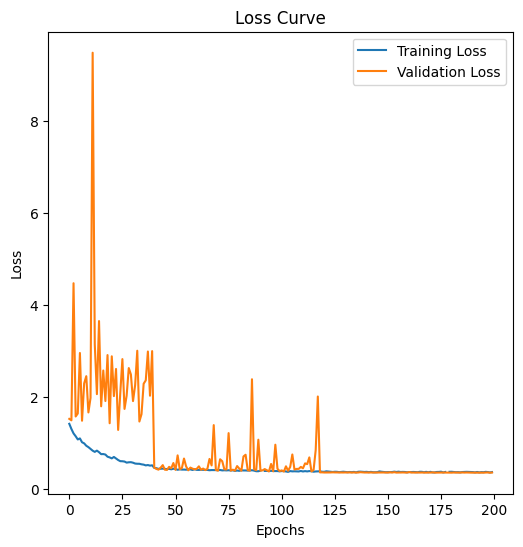

In [23]:
import matplotlib.pyplot as plt

# Plotting Training and Validation Loss
plt.figure(figsize=(6, 6))
plt.plot(train_losses, label='Training Loss')
plt.plot(valid_losses, label='Validation Loss')
plt.title('Loss Curve')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()


### Testing and evaluation

You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.


Test Accuracy: 0.9804
Mean Dice Score: 0.8214


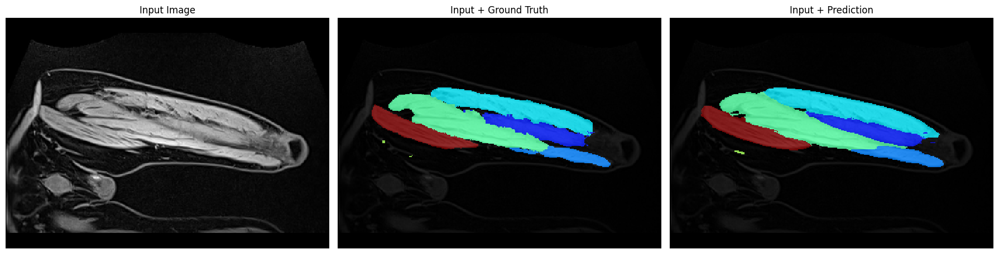

In [24]:
import os
import torch
import torch.nn.functional as F
import numpy as np
import matplotlib.pyplot as plt
from torch.utils.data import DataLoader
from sklearn.metrics import jaccard_score, f1_score
import random

# Load the saved model
model.load_state_dict(torch.load('best_model.pth'))  # Load the best model
model.to(device)
model.eval()  # Set the model to evaluation mode

# Create test DataLoader
num_workers = os.cpu_count() - 1
test_dataloader = DataLoader(
    test_dataset,
    batch_size=1,  # Testing one sample at a time for analysis
    shuffle=False,
    num_workers=num_workers,
    pin_memory=torch.cuda.is_available()
)

# Initialize metrics
total_dice = 0.0
correct_pixels = 0
total_pixels = 0
num_samples = 0

# Randomly select an index for visualization
random_index = random.randint(0, len(test_dataset) - 1)

# Variables to store data for visualization
random_image = None
random_label = None
random_pred = None

# Function to compute IoU and Dice
def compute_metrics(pred, label):
    pred_flat = pred.flatten()
    label_flat = label.flatten()

    # Compute IoU and Dice
    dice = f1_score(label_flat, pred_flat, average='macro', zero_division=0)
    return  dice

# Loop through the test DataLoader
with torch.no_grad():
    for idx, (image, label) in enumerate(test_dataloader):
        image, label = image.to(device), label.to(device)

        # Perform inference
        pred = model(image)  # Forward pass
        pred = F.softmax(pred, dim=1).argmax(dim=1)  # Get the most probable class for each pixel

        # Calculate metrics
        pred_np = pred.cpu().numpy().squeeze()  # Convert to NumPy
        label_np = label.cpu().numpy().squeeze()  # Convert to NumPy

        # Ensure shapes match
        if label_np.ndim == 3:  # One-hot encoded label
            label_np = np.argmax(label_np, axis=0)

        dice = compute_metrics(pred_np, label_np)
        total_dice += dice

        # Calculate pixel accuracy
        correct_pixels += (pred == label).sum().item()
        total_pixels += label.numel()

        # Store random sample for visualization
        if idx == random_index:
            random_image = image
            random_label = label
            random_pred = pred

        num_samples += 1

# Calculate mean metrics
mean_dice = total_dice / num_samples
test_accuracy = correct_pixels / total_pixels

print(f"Test Accuracy: {test_accuracy:.4f}")
print(f"Mean Dice Score: {mean_dice:.4f}")

# Visualization for the random sample
if random_image is not None and random_label is not None and random_pred is not None:
    # Prepare data for visualization
    random_image = random_image.squeeze().detach().cpu().numpy()  # Image
    random_label = random_label.squeeze().detach().cpu().numpy()  # Label
    random_pred = random_pred.squeeze().detach().cpu().numpy()  # Prediction

    # Convert one-hot encoded label to class indices if necessary
    if random_label.ndim == 3:  # One-hot encoded label
        random_label = np.argmax(random_label, axis=0)

    # Ensure the image is grayscale if it's a single-channel image
    if random_image.ndim == 3:
        random_image = random_image[0]  # Take the first channel if it's RGB

    # Plot the random image, label, and prediction
    plt.figure(figsize=(18, 6))

    # Original Image
    plt.subplot(1, 3, 1)
    plt.imshow(random_image, cmap='gray', interpolation='nearest')
    plt.title("Input Image")
    plt.axis('off')

    # Ground Truth Overlay
    plt.subplot(1, 3, 2)
    plt.imshow(random_image, cmap='gray', interpolation='nearest')  # Base image
    plt.imshow(random_label, cmap=custom_cmap, alpha=0.8, interpolation='nearest')  # Ground truth overlay
    plt.title("Input + Ground Truth")
    plt.axis('off')

    # Prediction Overlay
    plt.subplot(1, 3, 3)
    plt.imshow(random_image, cmap='gray', interpolation='nearest')  # Base image
    plt.imshow(random_pred, cmap=custom_cmap, alpha=0.8, interpolation='nearest')  # Prediction overlay
    plt.title("Input + Prediction")
    plt.axis('off')

    plt.tight_layout()
    plt.show()


# Active Learning

In [25]:
import numpy as np

def set_dropout_probability(model, new_dropout_prob):
    for module in model.modules():
        if isinstance(module, nn.Dropout):
            module.p = new_dropout_prob


def compute_entropy_map(prob_map):
    """
    Given a [C, H, W] average probability map for 2D segmentation,
    compute the pixel-wise entropy map.
    prob_map: [C, H, W] NumPy array of probabilities (sum across classes = 1).
    Returns a [H, W] array of per-pixel entropy.
    """
    eps = 1e-8
    # Entropy: -sum( p * log(p) ) across channels
    entropy_img = -np.sum(prob_map * np.log(prob_map + eps), axis=0)
    return entropy_img

def mean_slice_entropy(prob_map):
    """
    Aggregates the entropy_map into a single scalar for ranking.
    """
    emap = compute_entropy_map(prob_map)
    return float(np.mean(emap))

import random
import torch
import torch.nn.functional as F
import matplotlib.pyplot as plt


# Assume your test_dataset, model, etc. are defined,
# and you load your best weights before computing uncertainty
model.load_state_dict(torch.load("best_model.pth"))
model.to(device)
# Modifier le dropout pour l'inférence avec incertitude
set_dropout_probability(model, new_dropout_prob=0.2)

# IMPORTANT: put the model in `train()` so dropout is active
model.train()  # not eval()

num_mc_passes = 20  # how many stochastic forward passes
slices_with_uncertainty = []  # will store (uncert_scalar, idx, image, label, avg_probs, entropy_map)

test_dataloader = DataLoader(test_dataset, batch_size=1, shuffle=False)

with torch.no_grad():
    for idx, (image, label) in enumerate(test_dataloader):
        image, label = image.to(device), label.to(device)
        
        # Accumulate MC predictions
        pass_probs = []
        for _ in range(num_mc_passes):
            logits = model(image)  # [1, C, H, W]
            probs = F.softmax(logits, dim=1)  # [1, C, H, W]
            pass_probs.append(probs.squeeze(0).cpu().numpy())  # shape: [C, H, W]
        
        # Average across passes
        avg_probs = np.mean(np.stack(pass_probs, axis=0), axis=0)  # shape: [C, H, W]
        
        # Compute mean entropy
        slice_entropy = mean_slice_entropy(avg_probs)  # scalar
        # Also keep the full entropy map
        entropy_map = compute_entropy_map(avg_probs)    # shape: [H, W]
        
        # Save everything so we can sort later
        # Squeeze image/label for plotting
        image_np = image[0].cpu().numpy()  # [C, H, W]
        label_np = label[0].cpu().numpy()  # [H, W] or [C, H, W] if one-hot
        # Convert one-hot label if needed
        if label_np.ndim == 3:
            label_np = np.argmax(label_np, axis=0)
        
        slices_with_uncertainty.append((
            slice_entropy,
            idx,
            image_np,
            label_np,
            avg_probs,
            entropy_map
        ))

# Sort by descending uncertainty
slices_with_uncertainty.sort(key=lambda x: x[0], reverse=True)

# Pick top-24 slices for visualization
top_24 = slices_with_uncertainty[:40]

You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.


Rank 1 - Slice Index: 27, Mean Entropy: 0.2997


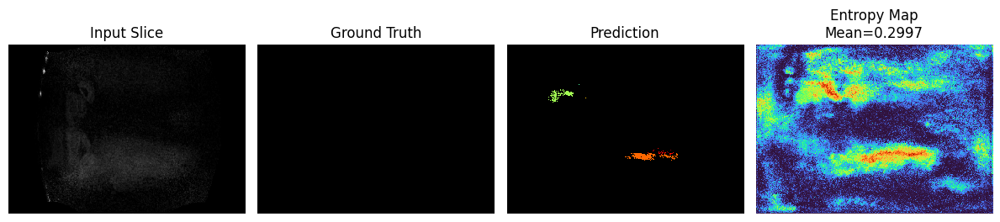

Rank 2 - Slice Index: 100, Mean Entropy: 0.2850


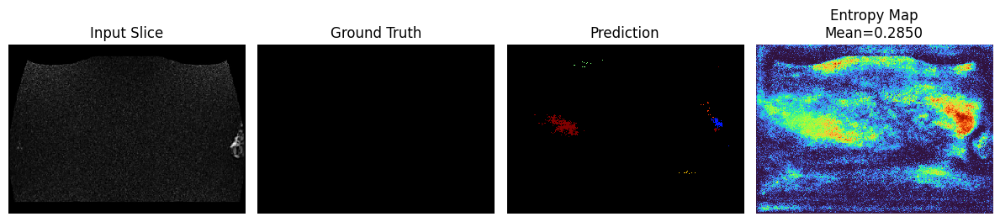

Rank 3 - Slice Index: 70, Mean Entropy: 0.2844


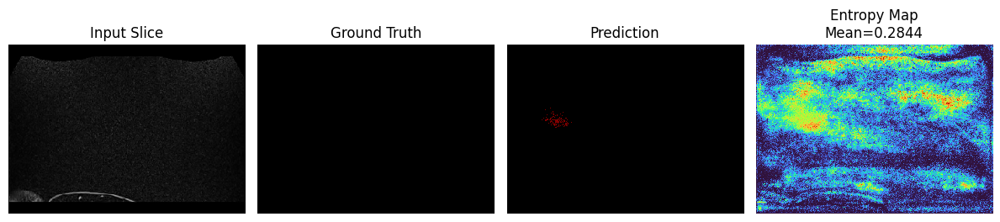

Rank 4 - Slice Index: 90, Mean Entropy: 0.2843


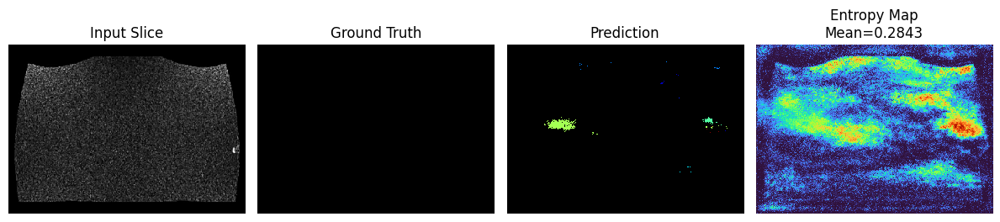

Rank 5 - Slice Index: 114, Mean Entropy: 0.2839


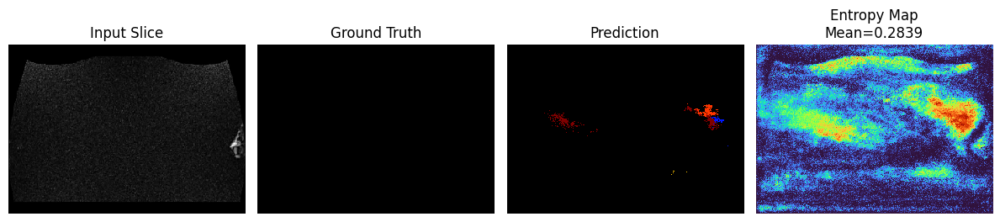

Rank 6 - Slice Index: 55, Mean Entropy: 0.2831


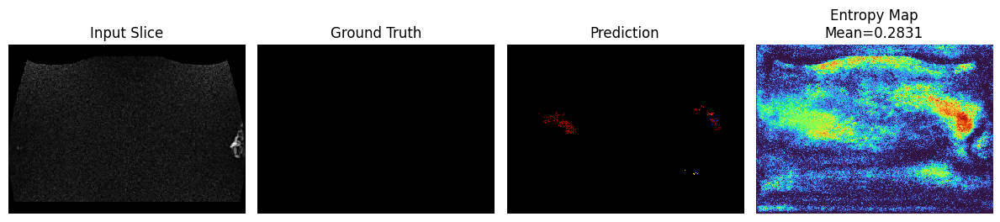

Rank 7 - Slice Index: 50, Mean Entropy: 0.2831


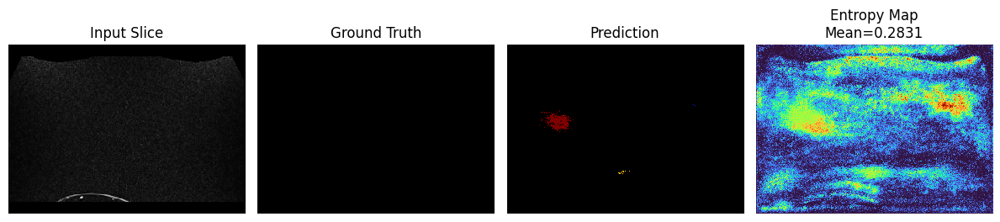

Rank 8 - Slice Index: 97, Mean Entropy: 0.2811


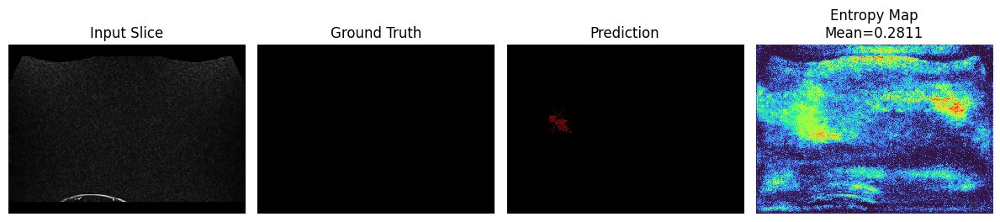

Rank 9 - Slice Index: 118, Mean Entropy: 0.2809


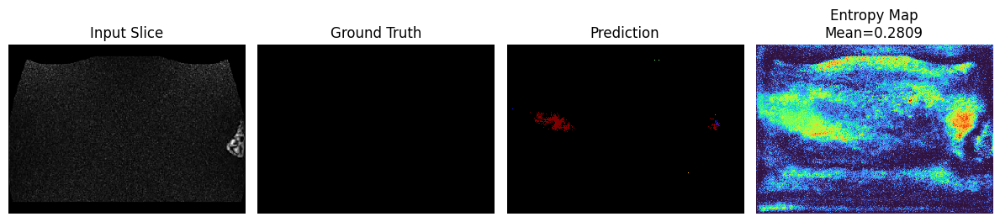

Rank 10 - Slice Index: 115, Mean Entropy: 0.2783


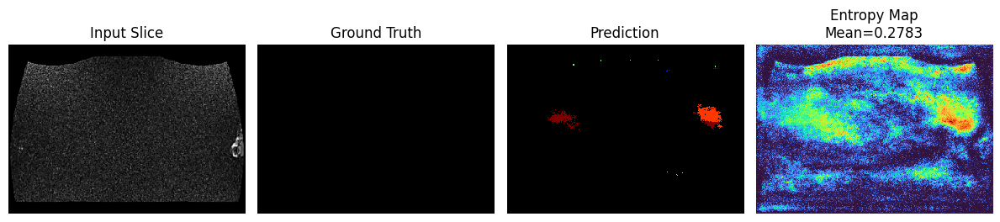

Rank 11 - Slice Index: 8, Mean Entropy: 0.2769


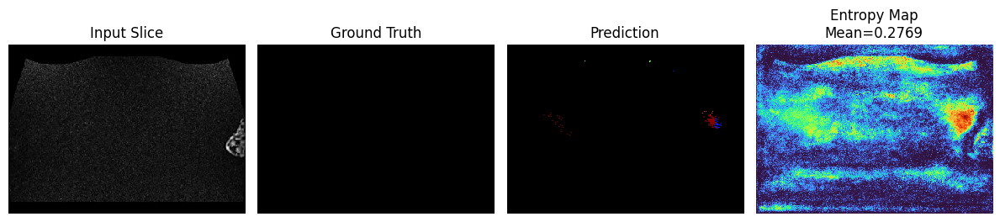

Rank 12 - Slice Index: 107, Mean Entropy: 0.2768


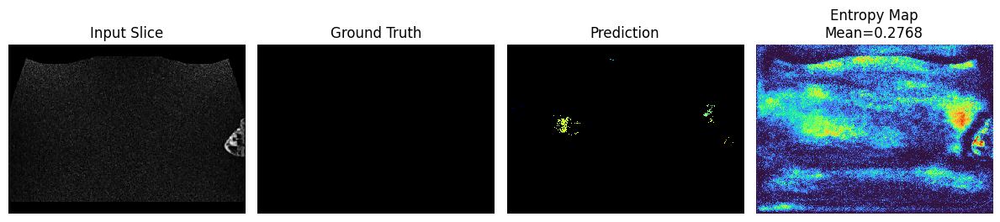

Rank 13 - Slice Index: 113, Mean Entropy: 0.2738


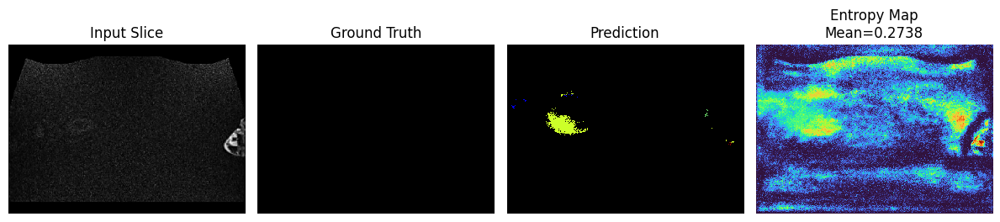

Rank 14 - Slice Index: 21, Mean Entropy: 0.2723


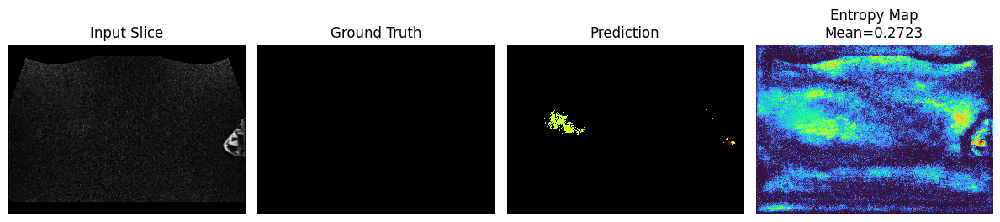

Rank 15 - Slice Index: 46, Mean Entropy: 0.2712


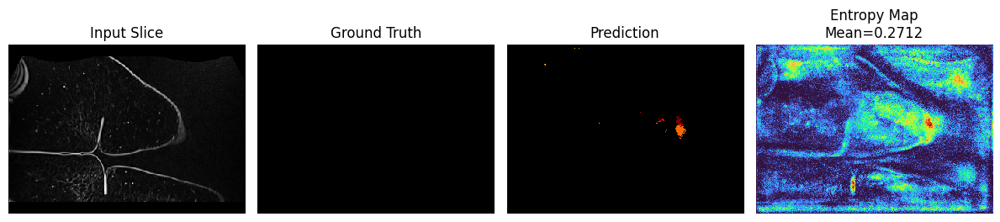

Rank 16 - Slice Index: 2, Mean Entropy: 0.2705


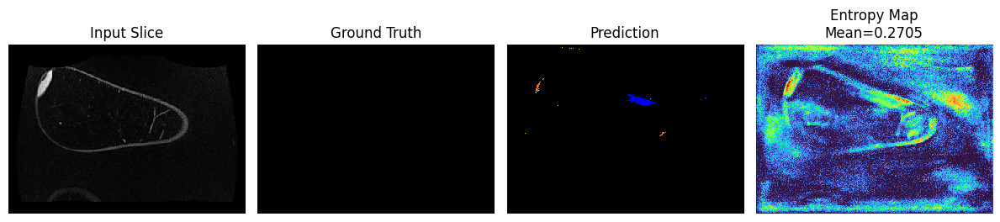

Rank 17 - Slice Index: 66, Mean Entropy: 0.2702


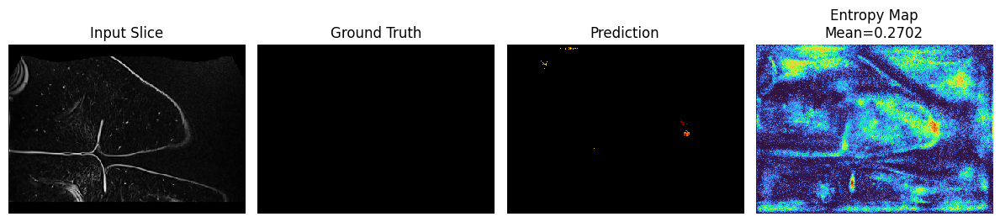

Rank 18 - Slice Index: 59, Mean Entropy: 0.2693


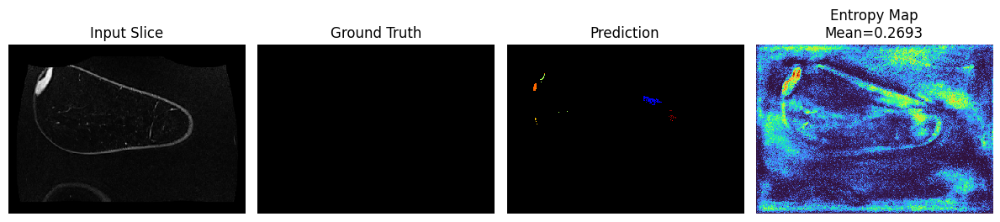

Rank 19 - Slice Index: 15, Mean Entropy: 0.2688


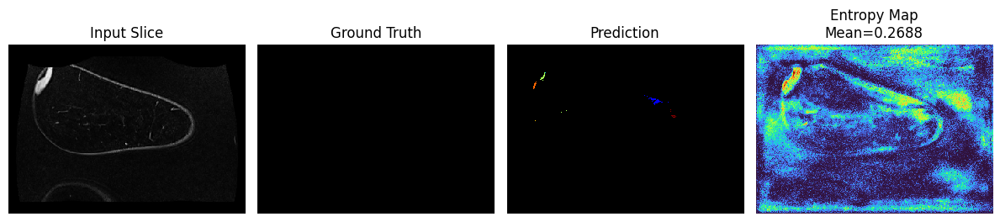

Rank 20 - Slice Index: 42, Mean Entropy: 0.2686


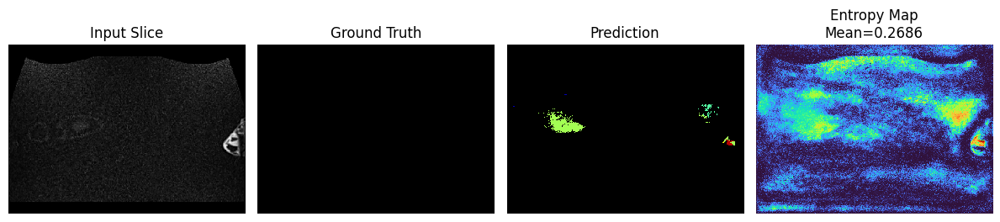

Rank 21 - Slice Index: 36, Mean Entropy: 0.2684


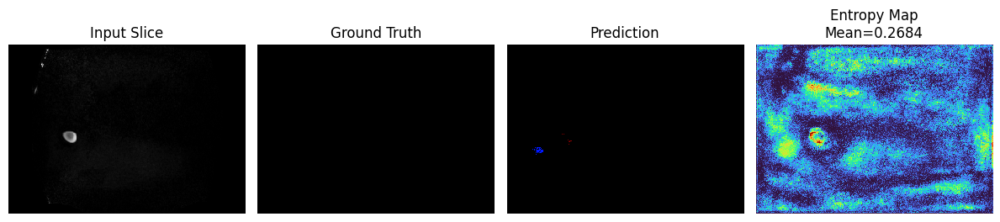

Rank 22 - Slice Index: 61, Mean Entropy: 0.2674


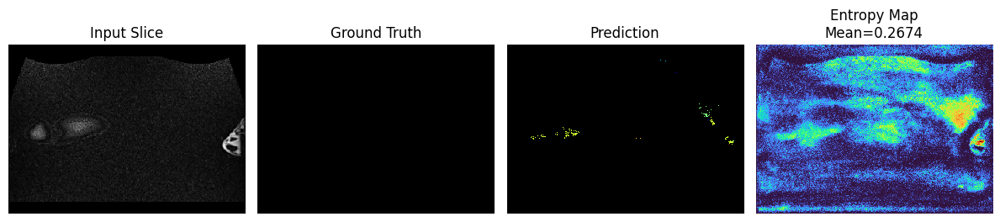

Rank 23 - Slice Index: 77, Mean Entropy: 0.2670


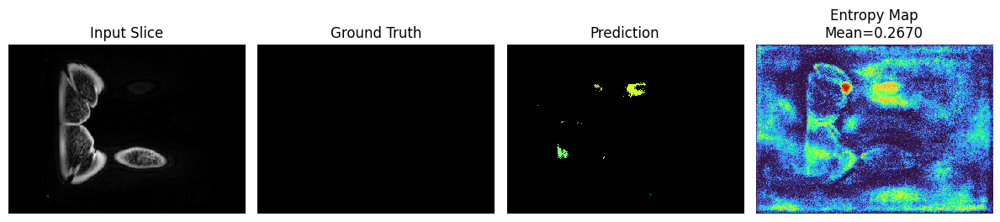

Rank 24 - Slice Index: 48, Mean Entropy: 0.2614


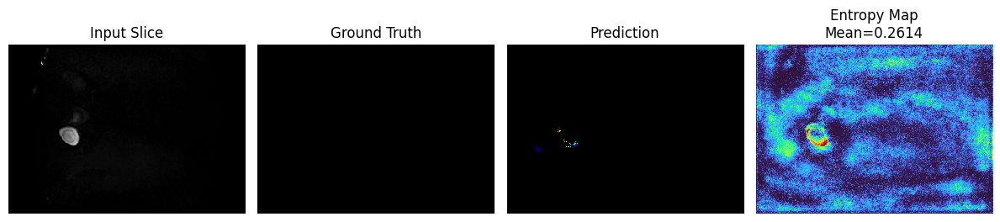

Rank 25 - Slice Index: 99, Mean Entropy: 0.2604


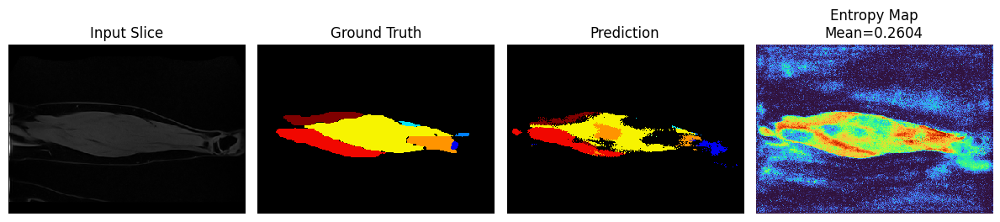

Rank 26 - Slice Index: 18, Mean Entropy: 0.2603


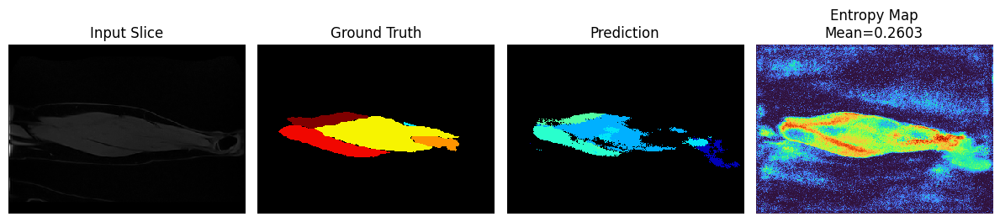

Rank 27 - Slice Index: 33, Mean Entropy: 0.2603


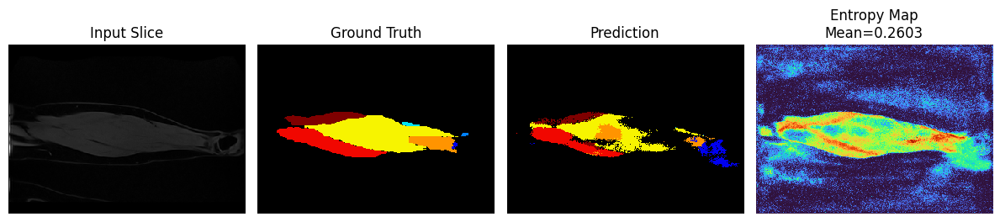

Rank 28 - Slice Index: 12, Mean Entropy: 0.2596


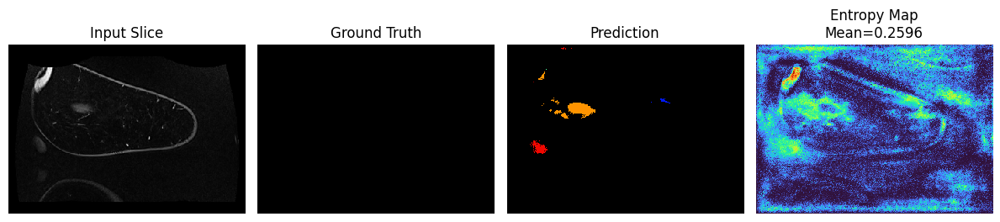

Rank 29 - Slice Index: 121, Mean Entropy: 0.2573


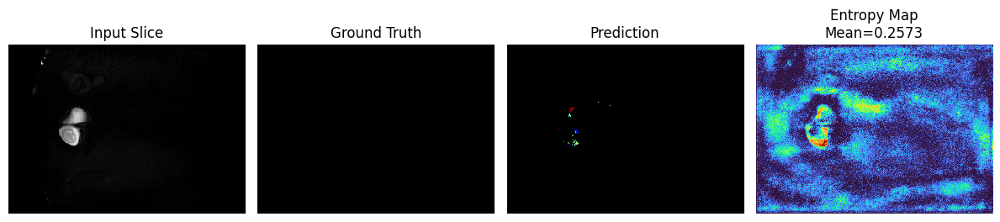

Rank 30 - Slice Index: 72, Mean Entropy: 0.2550


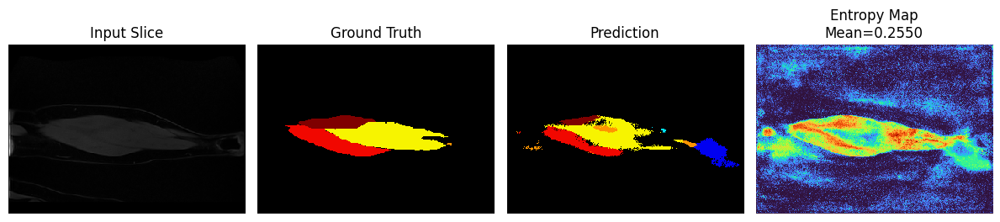

Rank 31 - Slice Index: 108, Mean Entropy: 0.2548


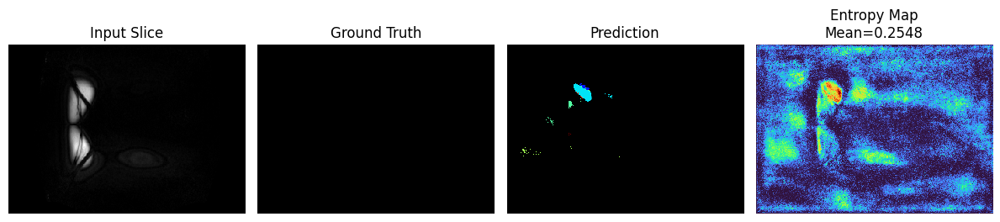

Rank 32 - Slice Index: 65, Mean Entropy: 0.2545


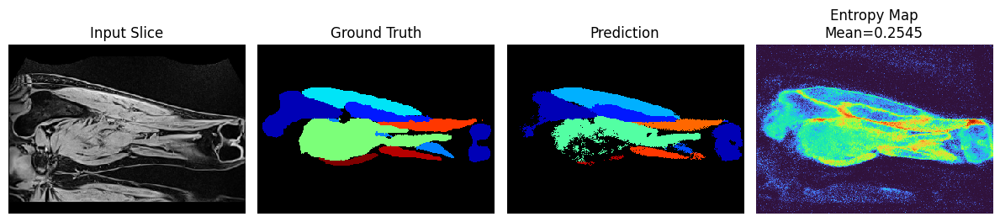

Rank 33 - Slice Index: 82, Mean Entropy: 0.2534


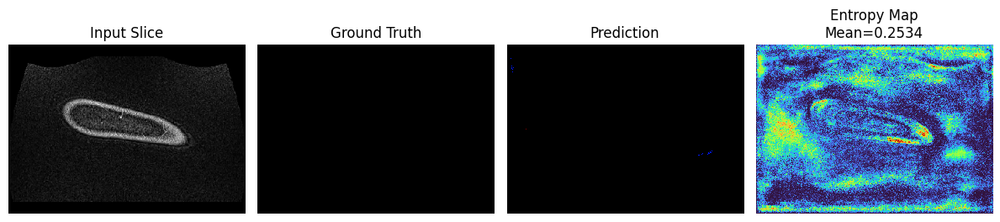

Rank 34 - Slice Index: 17, Mean Entropy: 0.2530


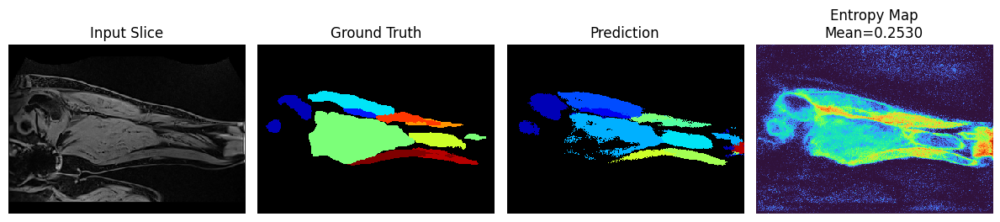

Rank 35 - Slice Index: 30, Mean Entropy: 0.2527


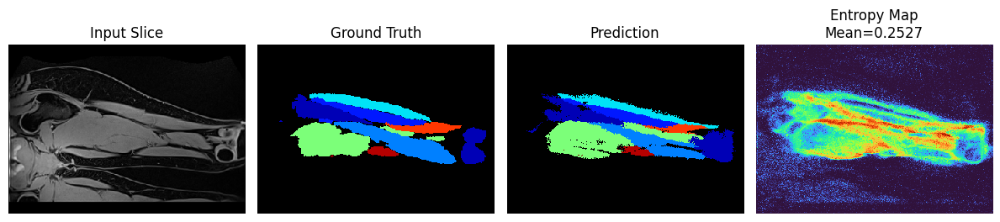

Rank 36 - Slice Index: 94, Mean Entropy: 0.2525


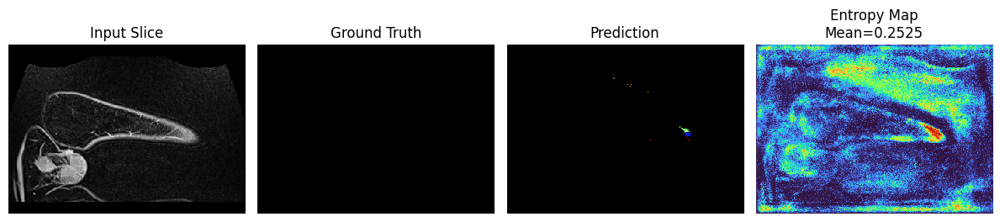

Rank 37 - Slice Index: 122, Mean Entropy: 0.2523


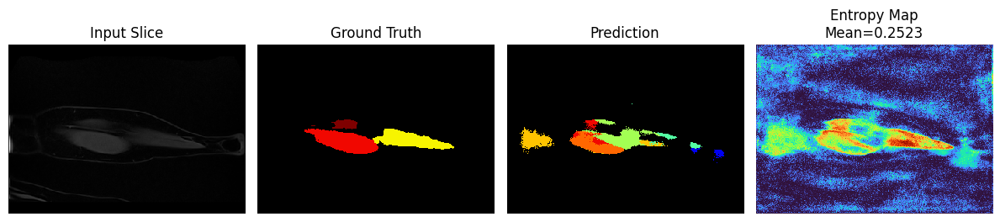

Rank 38 - Slice Index: 6, Mean Entropy: 0.2523


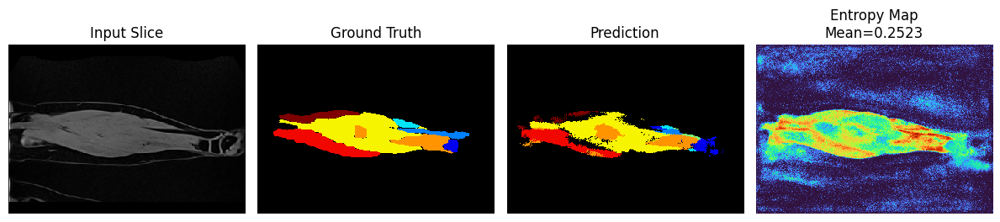

Rank 39 - Slice Index: 63, Mean Entropy: 0.2493


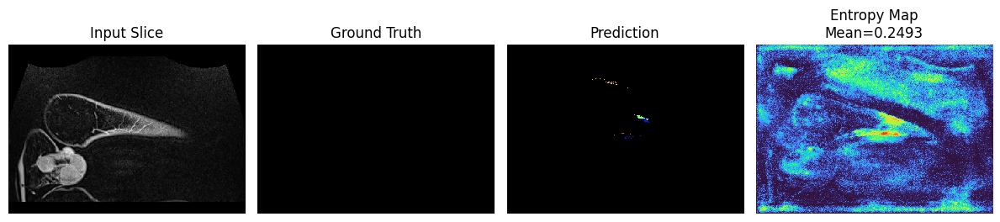

Rank 40 - Slice Index: 31, Mean Entropy: 0.2492


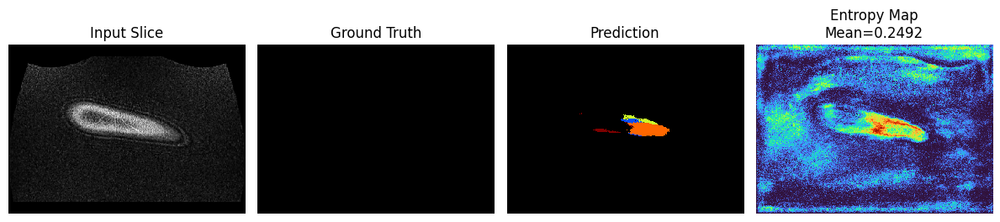

In [26]:

for rank, (uncert_scalar, idx, img_np, lbl_np, avg_probs, ent_map) in enumerate(top_24, start=1):
    # Reconstruct predicted classes
    pred_class = np.argmax(avg_probs, axis=0)  # [H, W]
    
    # If you have single-channel image, shape is e.g. [1, H, W], just take the first channel
    if img_np.ndim == 3:
        img_np = img_np[0]  # [H, W]
    
    print(f"Rank {rank} - Slice Index: {idx}, Mean Entropy: {uncert_scalar:.4f}")
    
    plt.figure(figsize=(12, 8))
    
    # 1) Input image
    plt.subplot(1, 4, 1)
    plt.imshow(img_np, cmap='gray', interpolation='nearest')
    plt.title("Input Slice")
    plt.axis('off')
    
    # 2) Ground truth
    plt.subplot(1, 4, 2)
    plt.imshow(lbl_np, cmap=custom_cmap, interpolation='nearest')
    plt.title("Ground Truth")
    plt.axis('off')
    
    # 3) Prediction
    plt.subplot(1, 4, 3)
    plt.imshow(pred_class, cmap=custom_cmap, interpolation='nearest')
    plt.title("Prediction")
    plt.axis('off')
    
    # 4) Uncertainty map
    plt.subplot(1, 4, 4)
    plt.imshow(ent_map, cmap='turbo', interpolation='nearest')
    plt.title(f"Entropy Map\nMean={uncert_scalar:.4f}")
    plt.axis('off')
    
    plt.tight_layout()
    plt.show()

In [27]:
print(len(slices_with_uncertainty),len(top_24))

123 40


### Select uncertain Slices

Image shape: (250, 350), Label shape: (250, 350)
Unique label values: [0]


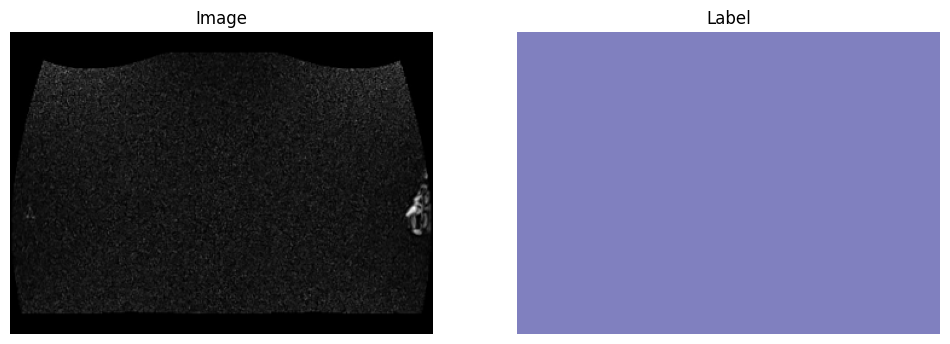

In [28]:
import torch
from torch.utils.data import Dataset, DataLoader
import numpy as np
import os
import matplotlib.pyplot as plt
import random

# Assuming top_24 contains the 24 most uncertain slices
# Each entry in top_24 is a tuple: (uncert_scalar, idx, img_np, lbl_np, avg_probs, ent_map)

# Create a dataset for the 24 most uncertain slices
class UncertainDataset(Dataset):
    def __init__(self, uncertain_slices):
        self.uncertain_slices = uncertain_slices

    def __len__(self):
        return len(self.uncertain_slices)

    def __getitem__(self, idx):
        _, _, image, label, _, _ = self.uncertain_slices[idx]
        return torch.tensor(image).float(), torch.tensor(label).long()

# Extract the top uncertain slices
uncertain_slices = [(uncert_scalar, idx, img_np, lbl_np, avg_probs, ent_map) for (uncert_scalar, idx, img_np, lbl_np, avg_probs, ent_map) in top_24]

# Create DataLoader for the uncertain slices
uncertain_dataset = UncertainDataset(uncertain_slices)
uncertain_data_loader = DataLoader(uncertain_dataset, batch_size=8, shuffle=True)

# Export the uncertain slices for future use
export_dir = 'exported_data'
os.makedirs(export_dir, exist_ok=True)
np.save(os.path.join(export_dir, 'uncertain_image_files.npy'), [img for (_, _, img, _, _, _) in uncertain_slices])
np.save(os.path.join(export_dir, 'uncertain_label_files.npy'), [lbl for (_, _, _, lbl, _, _) in uncertain_slices])

# Load the uncertain slices if needed
uncertain_images = np.load(os.path.join(export_dir, 'uncertain_image_files.npy'), allow_pickle=True)
uncertain_labels = np.load(os.path.join(export_dir, 'uncertain_label_files.npy'), allow_pickle=True)

# Create dataset and dataloader from loaded data
uncertain_slices = list(zip(uncertain_images, uncertain_labels))
uncertain_data_loader = DataLoader(UncertainDataset([(None, None, img, lbl, None, None) for img, lbl in uncertain_slices]), batch_size=8, shuffle=True)

# Function to plot a random slice from the DataLoader
def plot_random_slice(data_loader):
    # Get a random index
    random_idx = random.randint(0, len(data_loader.dataset) - 1)
    
    # Get the image and label
    image, label = data_loader.dataset[random_idx]
    
    # Convert to numpy for plotting
    image_np = image.numpy().squeeze()
    label_np = label.numpy().squeeze()
    
    # Check data shapes and unique label values
    print(f"Image shape: {image_np.shape}, Label shape: {label_np.shape}")
    print(f"Unique label values: {np.unique(label_np)}")
    
    # Plot the image and label
    plt.figure(figsize=(12, 6))
    
    # Plot image
    plt.subplot(1, 2, 1)
    plt.imshow(image_np, cmap='gray')
    plt.title('Image')
    plt.axis('off')
    
    # Plot label
    plt.subplot(1, 2, 2)
    plt.imshow(label_np, cmap='jet', alpha=0.5)
    plt.title('Label')
    plt.axis('off')
    
    plt.show()

# Plot a random slice
plot_random_slice(uncertain_data_loader)

Continual Learning with 

# Continual Learning with Replay Methods

### Train the model

In [29]:
def train_model_with_replay(model, train_loader, valid_loader, num_epochs, optimizer, scheduler, device, num_classes, dice_weight, hausdorff_weight):
    model = model.to(device)
    train_losses = []
    valid_losses = []
    best_valid_loss = float('inf')
    best_epoch = 0

    train_dice_metric = torchmetrics.Dice(num_classes=num_classes, average='macro', ignore_index=0).to(device)
    valid_dice_metric = torchmetrics.Dice(num_classes=num_classes, average='macro', ignore_index=0).to(device)

    for epoch in range(num_epochs):
        model.train()
        epoch_loss = 0
        correct_train = 0
        total_train = 0

        for images, labels in train_loader:
            images, labels = images.to(device), labels.to(device).to(torch.long)
            optimizer.zero_grad()
            outputs = model(images)
            loss = combined_loss(outputs, labels, num_classes, dice_weight=dice_weight, hausdorff_weight=hausdorff_weight)
            loss.backward()
            optimizer.step()
            epoch_loss += loss.item()
            mask = (labels > 0)
            _, predicted = torch.max(outputs, dim=1)
            correct_train += ((predicted == labels) & mask).sum().item()
            total_train += mask.sum().item()
            train_dice_metric.update(outputs, labels)

        train_loss = epoch_loss / len(train_loader)
        train_accuracy = correct_train / total_train
        train_dice = train_dice_metric.compute().item()
        train_dice_metric.reset()

        model.eval()
        valid_loss = 0.0
        correct_valid = 0
        total_valid = 0

        with torch.no_grad():
            for images, labels in valid_loader:
                images, labels = images.to(device), labels.to(device).to(torch.long)
                if labels.ndim == 4:
                    labels = labels.squeeze(1)
                outputs = model(images)
                loss = combined_loss(outputs, labels, num_classes, dice_weight=dice_weight, hausdorff_weight=hausdorff_weight)
                valid_loss += loss.item()
                _, predicted = torch.max(outputs, dim=1)
                mask = (labels > 0)
                correct_valid += ((predicted == labels) & mask).sum().item()
                total_valid += mask.sum().item()
                valid_dice_metric.update(outputs, labels)

        valid_loss = valid_loss / len(valid_loader)
        valid_accuracy = correct_valid / total_valid
        valid_dice = valid_dice_metric.compute().item()
        valid_dice_metric.reset()
        scheduler.step(valid_loss)
        train_losses.append(train_loss)
        valid_losses.append(valid_loss)

        print(f"Epoch {epoch+1}/{num_epochs} | Train Loss: {train_loss:.4f}, Valid Loss: {valid_loss:.4f} | Train Acc: {train_accuracy*100:.2f}%, Valid Acc: {valid_accuracy*100:.2f}% | Train Dice: {train_dice:.4f}, Valid Dice: {valid_dice:.4f}")

        if valid_loss < best_valid_loss:
            best_valid_loss = valid_loss
            best_epoch = epoch + 1
            torch.save(model.state_dict(), 'best_model_replay.pth')
            print(f"  Saved best model at epoch {best_epoch} with valid loss: {best_valid_loss:.4f}")

    model.load_state_dict(torch.load('best_model_replay.pth'))
    print(f"Best model selected at epoch {best_epoch} with valid loss: {best_valid_loss:.4f}")
    return model, train_losses, valid_losses

### Evaluate Model

In [30]:
import torch.nn.functional as F

def evaluate_model(model, data_loader, num_classes, device):
    model.eval()
    dice_metric = torchmetrics.Dice(num_classes=num_classes, average='macro', ignore_index=0).to(device)
    
    with torch.no_grad():
        for images, labels in data_loader:
            images, labels = images.to(device), labels.to(device).to(torch.long)
            
            # Perform inference
            outputs = model(images)
            
            # Apply softmax and argmax to get class predictions
            preds = F.softmax(outputs, dim=1).argmax(dim=1)
            
            # Update Dice metric
            dice_metric.update(preds, labels)
    
    dice_score = dice_metric.compute().item()
    return dice_score

### Create Datasets with Various Ratios and Usage (Train, Evaluate and Plot)

In [31]:
from torch.utils.data import ConcatDataset, Subset

# Load the pretrained model
pretrained_model_path = 'best_model.pth'
model.load_state_dict(torch.load(pretrained_model_path, weights_only=True))
model.to(device)

# Assuming train_dataset and test_dataset are already defined
total_samples = 80

# Define ratios
ratios = [(2,98),(98, 2),(50,50),(80,20)]

# Create datasets with varying ratios
datasets = []
used_test_indices = set([idx for (_, idx, _, _, _, _) in top_24])
for old_ratio, new_ratio in ratios:
    num_new_samples = int((new_ratio / 100) * total_samples)
    num_old_samples = int((old_ratio / 100) * total_samples)
    
    # Ensure we do not exceed the available new samples
    num_new_samples = min(num_new_samples, len(top_24))
    
    # Adjust the number of old samples to ensure the total does not exceed 40
    if num_new_samples + num_old_samples > total_samples:
        num_old_samples = total_samples - num_new_samples
    
    new_indices = [idx for (_, idx, _, _, _, _) in top_24[:num_new_samples]]
    old_indices = np.random.choice(len(train_dataset), num_old_samples, replace=False)
    
    new_dataset = Subset(test_dataset, new_indices)
    old_dataset = Subset(train_dataset, old_indices)
    
    combined_dataset = ConcatDataset([old_dataset, new_dataset])
    datasets.append(combined_dataset)

# Remove used test indices from test_dataset
remaining_test_indices = list(set(range(len(test_dataset))) - used_test_indices)
remaining_test_dataset = Subset(test_dataset, remaining_test_indices)

# Print summary
for (old_ratio, new_ratio), dataset in zip(ratios, datasets):
    num_old_samples = len(dataset.datasets[0])
    num_new_samples = len(dataset.datasets[1])
    print(f"Ratio {old_ratio}/{new_ratio}: {num_old_samples} images from old dataset, {num_new_samples} images from new dataset")

import matplotlib.pyplot as plt

# Define your model, optimizer, scheduler, and other parameters
optimizer = torch.optim.AdamW(model.parameters(), lr=learning_rate)
scheduler = ReduceLROnPlateau(optimizer, mode='min', factor=0.1, patience=10)
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
num_classes = 21  # Example number of classes
dice_weight = 0.7
hausdorff_weight = 0
num_epochs = 30

# Assuming valid_loader and test_loader are defined
valid_loader = valid_loader  # Your validation DataLoader
test_loader_replay = DataLoader(remaining_test_dataset, batch_size=1, shuffle=False, num_workers=os.cpu_count() - 1, pin_memory=torch.cuda.is_available())  # Your test DataLoader

Ratio 2/98: 1 images from old dataset, 40 images from new dataset
Ratio 98/2: 78 images from old dataset, 1 images from new dataset
Ratio 50/50: 40 images from old dataset, 40 images from new dataset
Ratio 80/20: 64 images from old dataset, 16 images from new dataset


You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.


Epoch 1/30 | Train Loss: nan, Valid Loss: 2.1485 | Train Acc: 73.65%, Valid Acc: 23.32% | Train Dice: 0.3177, Valid Dice: 0.0550
  Saved best model at epoch 1 with valid loss: 2.1485
Epoch 2/30 | Train Loss: 0.8328, Valid Loss: 2.6860 | Train Acc: 80.37%, Valid Acc: 20.99% | Train Dice: 0.2596, Valid Dice: 0.0312
Epoch 3/30 | Train Loss: nan, Valid Loss: 2.9172 | Train Acc: 79.08%, Valid Acc: 23.87% | Train Dice: 0.2635, Valid Dice: 0.0382
Epoch 4/30 | Train Loss: nan, Valid Loss: 3.9468 | Train Acc: 79.42%, Valid Acc: 14.77% | Train Dice: 0.2540, Valid Dice: 0.0155
Epoch 5/30 | Train Loss: nan, Valid Loss: 3.3799 | Train Acc: 85.07%, Valid Acc: 16.82% | Train Dice: 0.2834, Valid Dice: 0.0197
Epoch 6/30 | Train Loss: nan, Valid Loss: 3.0576 | Train Acc: 86.70%, Valid Acc: 16.50% | Train Dice: 0.3001, Valid Dice: 0.0121
Epoch 7/30 | Train Loss: nan, Valid Loss: 3.8024 | Train Acc: 88.72%, Valid Acc: 14.81% | Train Dice: 0.3207, Valid Dice: 0.0032
Epoch 8/30 | Train Loss: nan, Valid Loss

You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.


Epoch 1/30 | Train Loss: 0.6442, Valid Loss: 4.1233 | Train Acc: 83.30%, Valid Acc: 7.49% | Train Dice: 0.4949, Valid Dice: 0.0305
  Saved best model at epoch 1 with valid loss: 4.1233
Epoch 2/30 | Train Loss: 0.6179, Valid Loss: 5.1077 | Train Acc: 85.44%, Valid Acc: 0.68% | Train Dice: 0.5208, Valid Dice: 0.0058
Epoch 3/30 | Train Loss: 0.7165, Valid Loss: 6.6161 | Train Acc: 81.25%, Valid Acc: 0.02% | Train Dice: 0.4851, Valid Dice: 0.0002
Epoch 4/30 | Train Loss: 0.6544, Valid Loss: 6.2620 | Train Acc: 83.40%, Valid Acc: 1.94% | Train Dice: 0.4982, Valid Dice: 0.0154
Epoch 5/30 | Train Loss: 0.5853, Valid Loss: 4.8501 | Train Acc: 87.28%, Valid Acc: 7.79% | Train Dice: 0.5209, Valid Dice: 0.0509
Epoch 6/30 | Train Loss: 0.5540, Valid Loss: 2.8556 | Train Acc: 87.91%, Valid Acc: 27.69% | Train Dice: 0.5412, Valid Dice: 0.1795
  Saved best model at epoch 6 with valid loss: 2.8556
Epoch 7/30 | Train Loss: 0.5518, Valid Loss: 0.7000 | Train Acc: 88.34%, Valid Acc: 79.04% | Train Dice: 

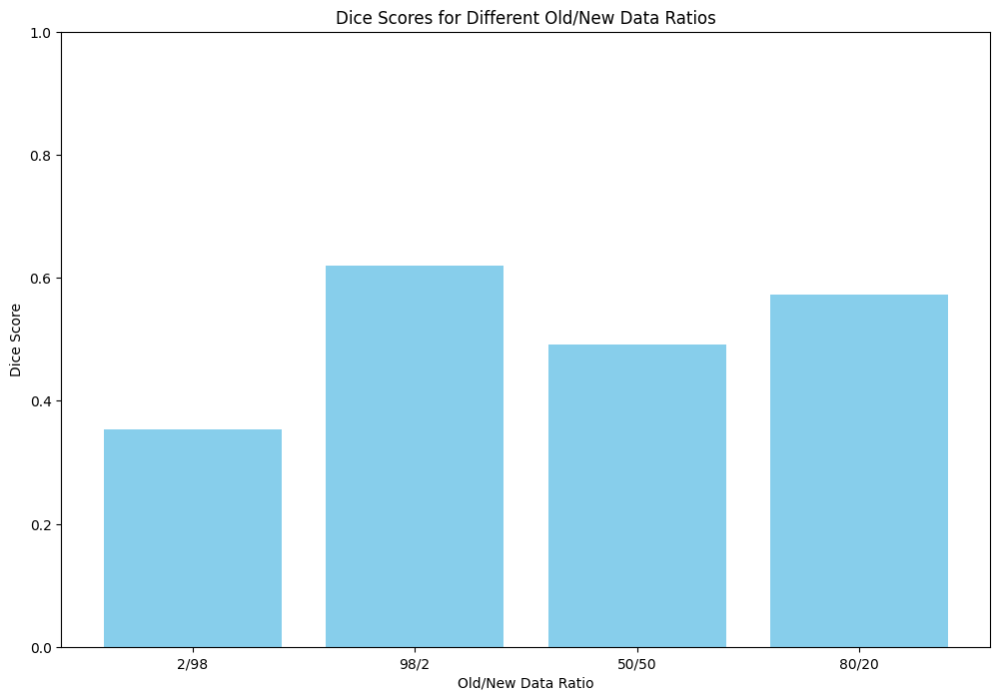

Ratio 2/98:
  Train Losses: [nan, 0.8327918450037638, nan, nan, nan, nan, nan, nan, nan, nan, 0.6430699527263641, nan, nan, nan, nan, nan, 0.608775814374288, 0.634869376818339, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan]
  Valid Losses: [2.1484785974025726, 2.685995429754257, 2.9172381460666656, 3.9467528760433197, 3.379867896437645, 3.0575615763664246, 3.8023528158664703, 1.6874925643205643, 1.1437918841838837, 1.1690887212753296, 1.4439251944422722, 1.535981446504593, 1.8013539388775826, 2.228620007634163, 2.3138652443885803, 1.9420872926712036, 1.46366548538208, 1.20820851624012, 1.4251039028167725, 2.1428363621234894, 1.8786614537239075, 1.7102612182497978, 1.2669057846069336, 1.0961640514433384, 0.9864290915429592, 0.9027880020439625, 0.9665589518845081, 1.135024607181549, 1.16273532807827, 1.0778161846101284]
  Test Dice Score: 0.3532
Ratio 98/2:
  Train Losses: [0.6442351460456848, 0.6179064512252808, 0.7165370941162109, 0.6544357895851135, 0.5852934718132019, 0.

In [32]:

# Train and evaluate for each ratio
results = {}
for (old_ratio, new_ratio), dataset in zip(ratios, datasets):
    train_loader = DataLoader(dataset, batch_size=8, shuffle=True)
    
    # Load the pretrained model before each training run
    model.load_state_dict(torch.load(pretrained_model_path))
    model.to(device)
    
    # Reinitialize optimizer and scheduler for each training run
    optimizer = torch.optim.AdamW(model.parameters(), lr=learning_rate)
    scheduler = ReduceLROnPlateau(optimizer, mode='min', factor=0.1, patience=10)
    
    model, train_losses, valid_losses = train_model_with_replay(model, train_loader, valid_loader, num_epochs, optimizer, scheduler, device, num_classes, dice_weight, hausdorff_weight)
    test_dice_score = evaluate_model(model, test_loader_replay, num_classes, device)
    results[f"{old_ratio}/{new_ratio}"] = (train_losses, valid_losses, test_dice_score)

# Plot the results as a bar chart
ratios_labels = list(results.keys())
dice_scores = [score[2] for score in results.values()]

plt.figure(figsize=(12, 8))
plt.bar(ratios_labels, dice_scores, color='skyblue')
plt.xlabel("Old/New Data Ratio")
plt.ylabel("Dice Score")
plt.title("Dice Scores for Different Old/New Data Ratios")
plt.ylim(0, 1)  # Assuming Dice scores are between 0 and 1
plt.show()

# Print train and validation losses for reference
for ratio, (train_losses, valid_losses, test_dice_score) in results.items():
    print(f"Ratio {ratio}:")
    print(f"  Train Losses: {train_losses}")
    print(f"  Valid Losses: {valid_losses}")
    print(f"  Test Dice Score: {test_dice_score:.4f}")